# Final Project Submission

Please fill out:
* Student name: Lauren Petrillo
* Student pace: Part time
* Scheduled project review date/time: 
* Instructor name: Claude Fried
* Blog post URL: https://medium.com/@lauren.petrillo13/how-to-build-your-first-linear-regression-model-3b61f8194cfa


# Introduction

## Objective

I was hired by West Seattle Realty (a local real estate agency) to provide insights to better their speciality in helping buyers and sellers navigate the King County residential home market.

Link to local agency: https://westseattlerealty.com/west-seattle-realty

## Questions to Consider for Modeling

1. What features in a house are linearly related to price?
2. What are the most important factors when determining price of a house?
3. Does location (zipcode/lat/long) have an effect on price?

## Importing Libraries

In [129]:
import pandas as pd
import numpy as np
from numpy.random import randn
from pandas import DataFrame, Series
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from scipy import stats
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate
from sklearn.preprocessing import OneHotEncoder, StandardScaler
warnings.filterwarnings("ignore")
%matplotlib inline
pd.set_option('display.max_columns', 0)
plt.style.use('seaborn')

## Load Data

In [130]:
data = pd.read_csv('data/kc_house_data.csv')

In [131]:
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


## King County Data Set Info

### Column Descriptions

* **id** - unique identified for a house
* **dateDate** - house was sold
* **pricePrice** -  is prediction target
* **bedroomsNumber** -  of Bedrooms/House
* **bathroomsNumber** -  of bathrooms/bedrooms
* **sqft_livingsquare** -  footage of the home
* **sqft_lotsquare** -  footage of the lot
* **floorsTotal** -  floors (levels) in house
* **waterfront** - House which has a view to a waterfront
* **view** - Has been viewed
* **condition** - How good the condition is ( Overall )
* **grade** - overall grade given to the housing unit, based on King County grading system
* **sqft_above** - square footage of house apart from basement
* **sqft_basement** - square footage of the basement
* **yr_built** - Built Year
* **yr_renovated** - Year when house was renovated
* **zipcode** - zip
* **lat** - Latitude coordinate
* **long** - Longitude coordinate
* **sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbors
* **sqft_lot15** - The square footage of the land lots of the nearest 15 neighbors

### Building Condition

Relative to age and grade. Coded 1-5.

1 = Poor- Worn out. Repair and overhaul needed on painted surfaces, roofing, plumbing, heating and numerous functional inadequacies. Excessive deferred maintenance and abuse, limited value-in-use, approaching abandonment or major reconstruction; reuse or change in occupancy is imminent. Effective age is near the end of the scale regardless of the actual chronological age.

2 = Fair- Badly worn. Much repair needed. Many items need refinishing or overhauling, deferred maintenance obvious, inadequate building utility and systems all shortening the life expectancy and increasing the effective age.

3 = Average- Some evidence of deferred maintenance and normal obsolescence with age in that a few minor repairs are needed, along with some refinishing. All major components still functional and contributing toward an extended life expectancy. Effective age and utility is standard for like properties of its class and usage.

4 = Good- No obvious maintenance required but neither is everything new. Appearance and utility are above the standard and the overall effective age will be lower than the typical property.

5= Very Good- All items well maintained, many having been overhauled and repaired as they have shown signs of wear, increasing the life expectancy and lowering the effective age with little deterioration or obsolescence evident with a high degree of utility.

### Building Grade

Represents the construction quality of improvements. Grades run from grade 1 to 13. Generally defined as:

1-3 = Falls short of minimum building standards. Normally cabin or inferior structure.

4 = Generally older, low quality construction. Does not meet code.

5 = Low construction costs and workmanship. Small, simple design.

6 = Lowest grade currently meeting building code. Low quality materials and simple designs.

7 = Average grade of construction and design. Commonly seen in plats and older sub-divisions.

8 = Just above average in construction and design. Usually better materials in both the exterior and interior finish work.

9 = Better architectural design with extra interior and exterior design and quality.

10 = Homes of this quality generally have high quality features. Finish work is better and more design quality is seen in the floor plans. Generally have a larger square footage.

11 = Custom design and higher quality finish work with added amenities of solid woods, bathroom fixtures and more luxurious options.

12 = Custom design and excellent builders. All materials are of the highest quality and all conveniences are present.

13 = Generally custom designed and built. Mansion level. Large amount of highest quality cabinet work, wood trim, marble, entry ways etc.

Received information on building grade and condition using this source: https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r

More information can be found regarding the demographics/background info of King County here: https://kingcounty.gov/depts/executive/performance-strategy-budget/regional-planning/Demographics.aspx

# Data Engineering

## Data Cleaning/Exploration

In [132]:
data.info()
#need to change sqft_basement and date from objects to ints
#waterfront, view, and yr_renovated have missing values
#look through data to see if any sets need to be dropped

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [133]:
#detect any missing values
data.isna().any()

id               False
date             False
price            False
bedrooms         False
bathrooms        False
sqft_living      False
sqft_lot         False
floors           False
waterfront        True
view              True
condition        False
grade            False
sqft_above       False
sqft_basement    False
yr_built         False
yr_renovated      True
zipcode          False
lat              False
long             False
sqft_living15    False
sqft_lot15       False
dtype: bool

In [134]:
data.isna().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

In [135]:
#dropped id because I didn't think it really affected the data set
data = data.drop(['id'], axis=1)

In [136]:
#replace missing values for waterfront, yr_renovated, and view  

fill_waterfront = ['waterfront']
fill_yr_renovated = ['yr_renovated']
fill_view = ['view']

for replace in fill_waterfront:
    missing = data[replace].mode()[0]
    data[replace].fillna(missing, inplace = True)
    
for replace in fill_yr_renovated:
    missing = data[replace].mode()[0]
    data[replace].fillna(missing, inplace = True)
    
for replace in fill_view:
    missing = data[replace].mode()[0]
    data[replace].fillna(missing, inplace = True)

In [137]:
data.isna().any()

date             False
price            False
bedrooms         False
bathrooms        False
sqft_living      False
sqft_lot         False
floors           False
waterfront       False
view             False
condition        False
grade            False
sqft_above       False
sqft_basement    False
yr_built         False
yr_renovated     False
zipcode          False
lat              False
long             False
sqft_living15    False
sqft_lot15       False
dtype: bool

In [138]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           21597 non-null  object 
 1   price          21597 non-null  float64
 2   bedrooms       21597 non-null  int64  
 3   bathrooms      21597 non-null  float64
 4   sqft_living    21597 non-null  int64  
 5   sqft_lot       21597 non-null  int64  
 6   floors         21597 non-null  float64
 7   waterfront     21597 non-null  float64
 8   view           21597 non-null  float64
 9   condition      21597 non-null  int64  
 10  grade          21597 non-null  int64  
 11  sqft_above     21597 non-null  int64  
 12  sqft_basement  21597 non-null  object 
 13  yr_built       21597 non-null  int64  
 14  yr_renovated   21597 non-null  float64
 15  zipcode        21597 non-null  int64  
 16  lat            21597 non-null  float64
 17  long           21597 non-null  float64
 18  sqft_l

In [139]:
#split up the month, day, and year from 'date'
data[['month', 'day', 'year']] = data['date'].str.split('/', expand=True)

In [140]:
data['month']

0        10
1        12
2         2
3        12
4         2
         ..
21592     5
21593     2
21594     6
21595     1
21596    10
Name: month, Length: 21597, dtype: object

In [141]:
#drop the date, day, and year. Only keeping the month
data = data.drop(['date','day', 'year'], axis=1)

In [142]:
#create new feature for month sold 
data['month_sold'] = data['month'].astype(str).astype(int)

In [143]:
# plot number of sales by month for King County home sales data
# data['sales_cnt']=1 # dummy variable to sum sales
# df_grp = data.groupby(['month_sold'])['sales_cnt'].sum().reset_index()

# # create barplot with average line
# f, ax = plt.subplots(1, 1, figsize=(12, 6))
# f.suptitle('Sales by Month in King County', fontsize=14, fontweight ='bold')
# sns.set_style("dark")
# ax = sns.barplot(data=df_grp, x='month_sold', y='sales_cnt', color='tab:blue', saturation=.5)
# ax.axhline(df_grp.sales_cnt.mean(), color='tab:orange')
# ax.set_xlabel('Month', fontsize=12)
# ax.set_ylabel('Number of Sales', fontsize=12)
# plt.tight_layout()
# plt.show()

In [144]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21597 non-null  float64
 1   bedrooms       21597 non-null  int64  
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  int64  
 4   sqft_lot       21597 non-null  int64  
 5   floors         21597 non-null  float64
 6   waterfront     21597 non-null  float64
 7   view           21597 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  int64  
 11  sqft_basement  21597 non-null  object 
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   21597 non-null  float64
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  int64  
 18  sqft_l

In [145]:
#drop the month since we don't need that anymore
data = data.drop(['month'], axis=1)

In [146]:
#first fill the '?' value with '0.0' and then convert sqft_basement from a string to a float
data['sqft_basement'] = data['sqft_basement'].replace(to_replace = '?', value = 0.0)
data['sqft_basement'] = data['sqft_basement'].astype(str).astype(float)

In [147]:
#convert zipcode into string
# data['zipcode'] = data['zipcode'].astype(int).astype(str)

In [148]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21597 non-null  float64
 1   bedrooms       21597 non-null  int64  
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  int64  
 4   sqft_lot       21597 non-null  int64  
 5   floors         21597 non-null  float64
 6   waterfront     21597 non-null  float64
 7   view           21597 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  int64  
 11  sqft_basement  21597 non-null  float64
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   21597 non-null  float64
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  int64  
 18  sqft_l

In [149]:
data['price'].describe()

count    2.159700e+04
mean     5.402966e+05
std      3.673681e+05
min      7.800000e+04
25%      3.220000e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64

<AxesSubplot:xlabel='price'>

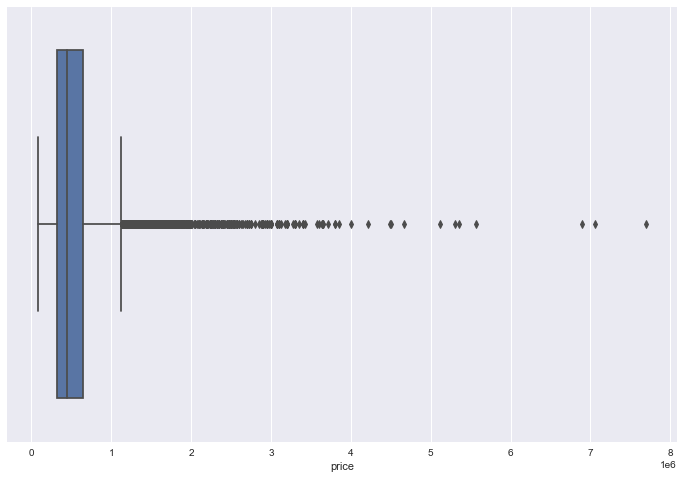

In [150]:
fig, ax = plt.subplots(figsize=(12,8))
sns.boxplot(x='price', data=data, ax=ax)

In [151]:
data['price'].sort_values()

15279      78000.0
465        80000.0
16184      81000.0
8267       82000.0
2139       82500.0
           ...    
1446     5350000.0
4407     5570000.0
9245     6890000.0
3910     7060000.0
7245     7700000.0
Name: price, Length: 21597, dtype: float64

In [152]:
# data['price'] = data['price'].apply(lambda x: round(float(x)), 2)

In [153]:
# data['price'].plot()

In [154]:
# ax.ticklabel_format(useOffset=False)

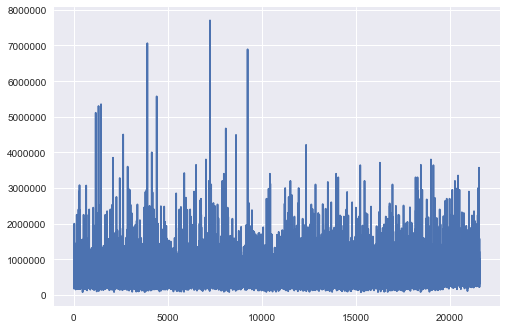

In [155]:
data['price'].plot()
plt.ticklabel_format(style='plain')

In [156]:
# fig, ax = plt.subplots(figsize=(12,8))
# sns.boxplot(x='price', data=data, ax=ax)
# plt.ticklabel_format(style='plain')

In [157]:
#drop outliers
data = data.loc[data['price'] < 6000000]

Bedrooms

In [158]:
#looking at bedrooms
data['bedrooms'].value_counts()

3     9824
4     6882
2     2760
5     1600
6      270
1      196
7       38
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64

<AxesSubplot:xlabel='bedrooms'>

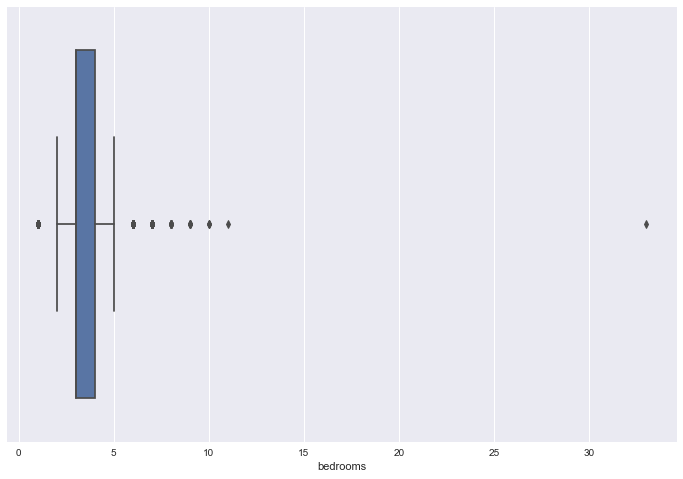

In [159]:
fig, ax = plt.subplots(figsize=(12,8))
sns.boxplot(x='bedrooms', data=data, ax=ax)

In [160]:
#drop outliers
data = data.loc[data['bedrooms'] < 15]

**Waterfront**

In [161]:
data['waterfront'].value_counts()

0.0    21448
1.0      145
Name: waterfront, dtype: int64

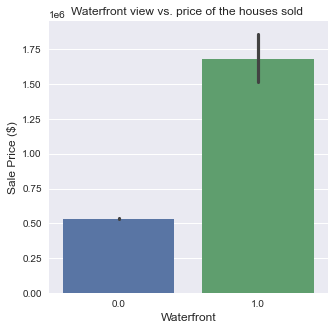

In [162]:
fig = plt.figure(figsize=(5, 5))
sns.barplot(data=data, y='price', x='waterfront')
plt.title('Waterfront view vs. price of the houses sold ', fontsize=12)
plt.xlabel("Waterfront", fontsize=12)
plt.ylabel('Sale Price ($)', fontsize=12)
plt.show()

Sqft_living

In [163]:
#looking at sqft_living column
data['sqft_living'].describe()

count    21593.000000
mean      2079.151160
std        912.524828
min        370.000000
25%       1430.000000
50%       1910.000000
75%       2550.000000
max      13540.000000
Name: sqft_living, dtype: float64

<AxesSubplot:xlabel='sqft_living'>

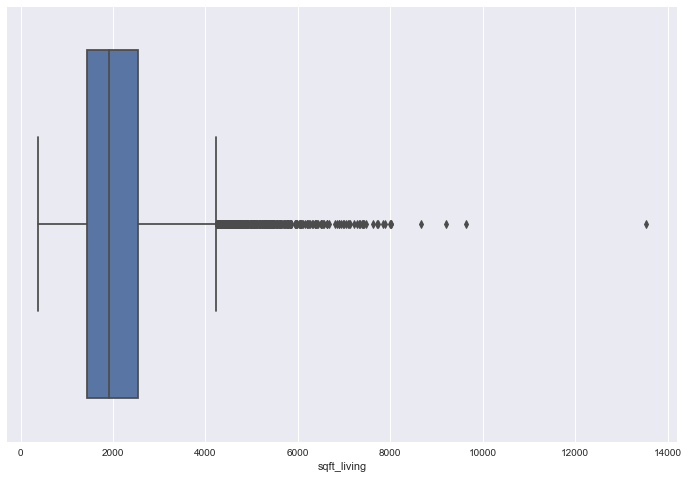

In [164]:
fig, ax = plt.subplots(figsize=(12,8))
sns.boxplot(x='sqft_living', data=data, ax=ax)

In [165]:
#Get rid of outliers
# data = data.loc[data['sqft_living'] < 8000]

**Price per sqft**

In [166]:
#creating price per sqft to use later on
data['price_per_sqft'] = data['price'] / data['sqft_living']
data['price_per_sqft']

0        188.050847
1        209.338521
2        233.766234
3        308.163265
4        303.571429
            ...    
21592    235.294118
21593    173.160173
21594    394.216667
21595    250.000000
21596    318.627451
Name: price_per_sqft, Length: 21593, dtype: float64

**Sqft_lot**

In [167]:
#looking at sqft_lot column
data['sqft_lot'].describe()

count    2.159300e+04
mean     1.509747e+04
std      4.141591e+04
min      5.200000e+02
25%      5.040000e+03
50%      7.617000e+03
75%      1.068200e+04
max      1.651359e+06
Name: sqft_lot, dtype: float64

In [168]:
# fig, ax = plt.subplots(figsize=(12,8))
# sns.boxplot(x='sqft_lot', data=data, ax=ax)
# plt.ticklabel_format(style='plain')

In [169]:
#Get rid of outliers
data = data.loc[data['sqft_lot'] < 150000]

In [170]:
data['sqft_lot'].max()

149410

In [171]:
data['sqft_lot'].sort_values()

15729       520
5821        572
7582        600
3449        609
20588       635
          ...  
7657     145490
9819     147823
18811    147856
12146    148975
7928     149410
Name: sqft_lot, Length: 21262, dtype: int64

In [172]:
#Get rid of outliers
# data = data.loc[data['sqft_lot'] < 1000000]

Floors

In [173]:
#looking at floors column
data['floors'].value_counts()

1.0    10551
2.0     8072
1.5     1869
3.0      609
2.5      154
3.5        7
Name: floors, dtype: int64

<AxesSubplot:xlabel='floors'>

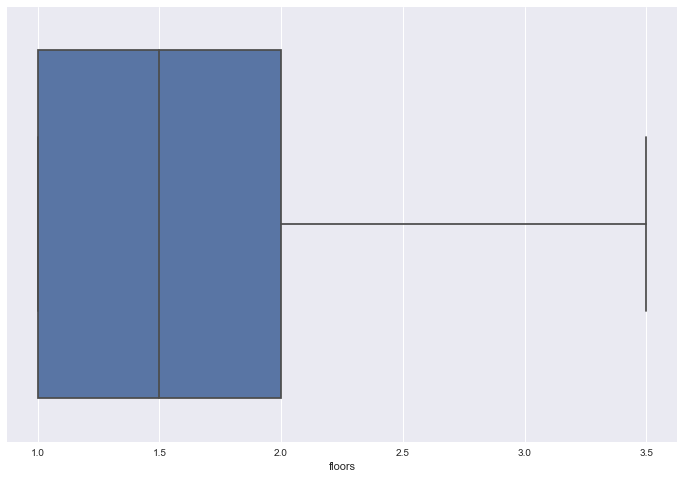

In [174]:
fig, ax = plt.subplots(figsize=(12,8))
sns.boxplot(x='floors', data=data, ax=ax)

In [175]:
# data = data.loc[data['floors'] < 2.5]

Condition

In [176]:
#looking at condition
data['condition'].value_counts()

3    13779
4     5609
5     1685
2      161
1       28
Name: condition, dtype: int64

<AxesSubplot:xlabel='condition'>

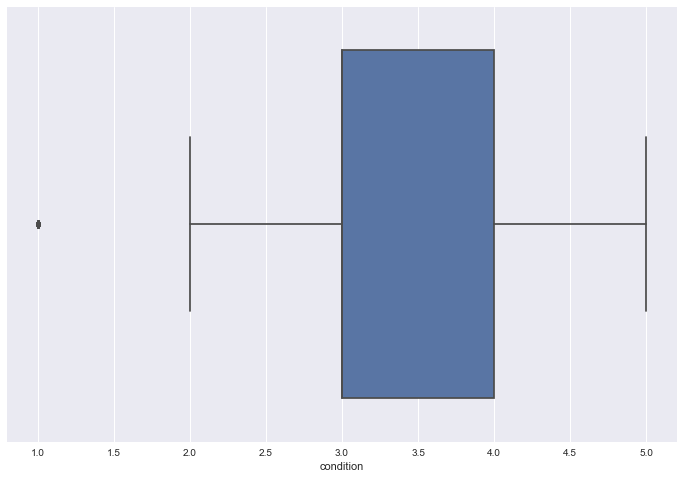

In [177]:
fig, ax = plt.subplots(figsize=(12,8))
sns.boxplot(x='condition', data=data, ax=ax)

In [178]:
# data = data.loc[data['condition'] > 2]

Grade

In [179]:
#looking at grade
data['grade'].value_counts()

7     8888
8     5990
9     2541
6     2019
10    1089
11     379
5      236
12      81
4       27
13      11
3        1
Name: grade, dtype: int64

<AxesSubplot:xlabel='grade'>

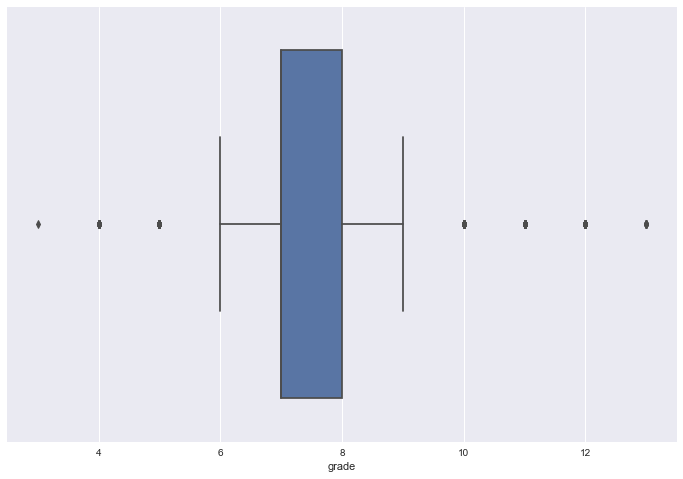

In [180]:
fig, ax = plt.subplots(figsize=(12,8))
sns.boxplot(x='grade', data=data, ax=ax)

In [181]:
# fig = plt.figure(figsize=(15, 8))
# sns.barplot(data=data, y='price', x='grade')
# plt.title('House grade vs. price of the house sold', fontsize=15)
# plt.xlabel("Grade", fontsize=15)
# plt.ylabel('Sale Price ($)', fontsize=15)
# plt.ticklabel_format(style='plain')
# plt.show()

**Sqft_living15**

In [182]:
#looking at sqft_living 15
data['sqft_living15'].describe()

count    21262.000000
mean      1979.818126
std        682.628972
min        399.000000
25%       1480.000000
50%       1830.000000
75%       2350.000000
max       6210.000000
Name: sqft_living15, dtype: float64

<AxesSubplot:xlabel='sqft_living15'>

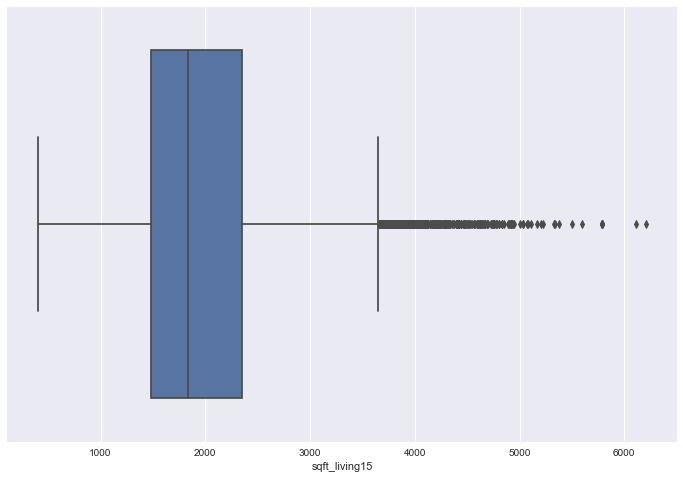

In [183]:
fig, ax = plt.subplots(figsize=(12,8))
sns.boxplot(x='sqft_living15', data=data, ax=ax)

In [184]:
# data = data.loc[data['sqft_living15'] < 5000]

Sqft_lot15

In [185]:
#looking at sqft_lot 15
data['sqft_lot15'].describe()

count     21262.000000
mean      10568.807732
std       16180.644101
min         651.000000
25%        5080.000000
50%        7561.500000
75%        9945.750000
max      434728.000000
Name: sqft_lot15, dtype: float64

<AxesSubplot:xlabel='sqft_lot15'>

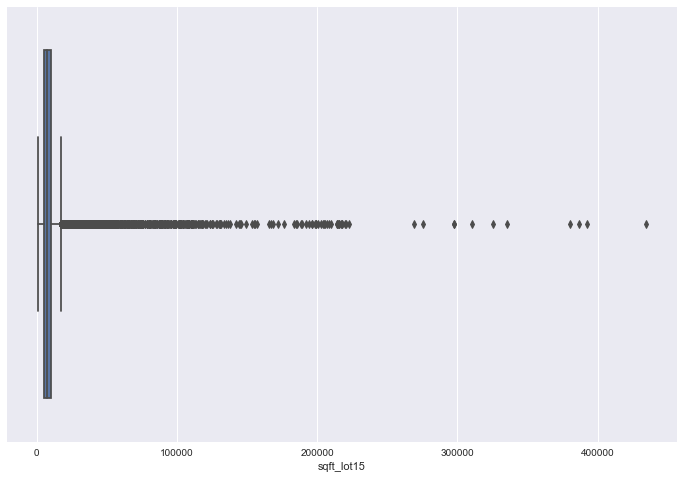

In [186]:
 fig, ax = plt.subplots(figsize=(12,8))
sns.boxplot(x='sqft_lot15', data=data, ax=ax)

In [187]:
data['zipcode'].unique()

array([98178, 98125, 98028, 98136, 98074, 98053, 98003, 98198, 98146,
       98038, 98007, 98115, 98107, 98126, 98019, 98103, 98002, 98133,
       98040, 98092, 98030, 98119, 98112, 98052, 98027, 98117, 98058,
       98001, 98056, 98166, 98023, 98070, 98148, 98105, 98042, 98008,
       98059, 98122, 98144, 98004, 98005, 98034, 98075, 98116, 98010,
       98118, 98199, 98032, 98045, 98102, 98077, 98108, 98168, 98177,
       98065, 98029, 98006, 98109, 98022, 98033, 98155, 98024, 98011,
       98031, 98106, 98072, 98188, 98014, 98055, 98039], dtype=int64)

In [188]:
zipcodes = list(data['zipcode'].unique())
zipcodes

[98178,
 98125,
 98028,
 98136,
 98074,
 98053,
 98003,
 98198,
 98146,
 98038,
 98007,
 98115,
 98107,
 98126,
 98019,
 98103,
 98002,
 98133,
 98040,
 98092,
 98030,
 98119,
 98112,
 98052,
 98027,
 98117,
 98058,
 98001,
 98056,
 98166,
 98023,
 98070,
 98148,
 98105,
 98042,
 98008,
 98059,
 98122,
 98144,
 98004,
 98005,
 98034,
 98075,
 98116,
 98010,
 98118,
 98199,
 98032,
 98045,
 98102,
 98077,
 98108,
 98168,
 98177,
 98065,
 98029,
 98006,
 98109,
 98022,
 98033,
 98155,
 98024,
 98011,
 98031,
 98106,
 98072,
 98188,
 98014,
 98055,
 98039]

In [189]:
#creating dict to store a new zip series 
zip_dct = {}
all_zips = data.groupby('zipcode')
for z in zipcodes:
    zip_dct[z] = all_zips.get_group(z).reset_index()['price']

In [190]:
zip_df = pd.DataFrame(zip_dct)

In [191]:
#find mean value and reset index
zip_mean = zip_df.reset_index(zip_df.mean().sort_values(ascending=False), axis=1)

TypeError: reset_index() got an unexpected keyword argument 'axis'

In [192]:
#find mean value and reset index
zip_mean = zip_df.reindex(zip_df.mean().sort_values(ascending=False).index, axis=1)

In [193]:
zip_mean.count()

98039     49
98004    316
98040    282
98112    269
98109    109
        ... 
98022    197
98001    359
98032    125
98168    269
98002    199
Length: 70, dtype: int64

In [194]:
zip_mean = zip_mean.fillna(0)
zip_mean

,98039,98004,98040,98112,98109,98105,98006,98119,98102,98005,98033,98199,98075,98074,98177,98077,98053,98008,98052,98122,98115,98116,98007,98027,98029,98144,98103,98107,98117,98072,98136,98065,98034,98059,98011,98125,98024,98166,98070,98028,98126,98155,98056,98118,98014,98019,98045,98133,98010,98146,98038,98108,98058,98092,98106,98178,98042,98055,98198,98031,98030,98003,98188,98023,98148,98022,98001,98032,98168,98002
0,2950000.0,975000.0,2000000.0,667000.0,890000.0,920000.0,527700.0,937000.0,850830.0,1040000.0,917500.0,1100000.0,832500.0,510000.0,660000.0,699950.0,1230000.0,951000.0,719000.0,425000.0,468000.0,480000.0,662500.0,580500.0,453246.0,317625.0,485000.0,530000.0,687500.0,467000.0,604000.0,430000.0,325000.0,430000.0,527000.0,538000.0,440000.0,775000.0,1350000.0,180000.0,650000.0,230000.0,605000.0,355000.0,299000.0,395000.0,437500.0,385000.0,720000.0,229500.0,323000.0,329950.0,322500.0,285000.0,181000.0,221900.0,292500.0,364950.0,291850.0,235000.0,252700.0,257500.0,267500.0,210490.0,228000.0,247000.0,240000.0,247500.0,171800.0,189000.0
1,1910000.0,1330000.0,905000.0,780000.0,610000.0,885000.0,500000.0,685000.0,740000.0,790000.0,1100000.0,331000.0,900000.0,400000.0,330000.0,680000.0,861990.0,380000.0,550000.0,425000.0,438000.0,425000.0,785000.0,597750.0,520000.0,535000.0,570000.0,640000.0,535000.0,559900.0,335000.0,201000.0,391500.0,356000.0,525000.0,571000.0,213000.0,650000.0,369900.0,310000.0,470000.0,387000.0,345000.0,445000.0,80000.0,488000.0,415000.0,280000.0,416000.0,255000.0,360000.0,423000.0,309000.0,305000.0,385000.0,205425.0,301000.0,237000.0,188500.0,290000.0,329000.0,230000.0,240000.0,243500.0,289000.0,269950.0,287000.0,258000.0,280000.0,233000.0
2,875000.0,1090000.0,799000.0,725000.0,550000.0,625504.0,2250000.0,940000.0,865000.0,849950.0,1030000.0,1450000.0,686000.0,625000.0,467000.0,1370000.0,479950.0,490000.0,470000.0,385000.0,696000.0,679900.0,469950.0,660500.0,435500.0,399950.0,518500.0,675000.0,600000.0,365500.0,525000.0,552250.0,438000.0,320000.0,333500.0,315000.0,350000.0,505000.0,309600.0,452000.0,465000.0,451000.0,461000.0,477000.0,405000.0,389000.0,255000.0,410000.0,204000.0,445838.0,390000.0,475000.0,290000.0,212000.0,285000.0,445000.0,204000.0,578000.0,269950.0,365000.0,260000.0,199000.0,238000.0,153000.0,319990.0,295000.0,480000.0,260000.0,340500.0,225000.0
3,940000.0,1450000.0,840000.0,490000.0,453500.0,550700.0,807100.0,665000.0,1010000.0,638700.0,900000.0,650000.0,879000.0,560000.0,550000.0,274975.0,516500.0,530000.0,770000.0,410000.0,450000.0,650000.0,431650.0,430000.0,533600.0,1070000.0,822500.0,519950.0,585000.0,400000.0,442000.0,437500.0,441000.0,274250.0,452000.0,382500.0,535000.0,284000.0,517534.0,770000.0,210000.0,475000.0,215000.0,349500.0,342000.0,330000.0,465000.0,420000.0,185000.0,390000.0,360000.0,404000.0,375000.0,278500.0,345000.0,236000.0,349000.0,370000.0,279950.0,304900.0,325000.0,220000.0,469000.0,199000.0,310000.0,360000.0,465000.0,205000.0,215000.0,250000.0
4,4000000.0,2900000.0,1510000.0,2250000.0,725000.0,880000.0,673000.0,2380000.0,425000.0,480000.0,604950.0,543500.0,785000.0,592500.0,385000.0,950000.0,780000.0,420000.0,784000.0,2050000.0,549000.0,725000.0,900000.0,420000.0,485000.0,425000.0,511000.0,560000.0,430000.0,496500.0,378000.0,650000.0,370000.0,500000.0,405000.0,425000.0,600000.0,180250.0,705000.0,330000.0,550000.0,550000.0,650000.0,405000.0,361000.0,355000.0,437000.0,371500.0,267000.0,232000.0,314000.0,442000.0,205000.0,200000.0,259950.0,170000.0,297000.0,280000.0,237000.0,268000.0,245000.0,282950.0,245000.0,260000.0,260000.0,265000.0,360000.0,299000.0,240500.0,266000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
596,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,69000

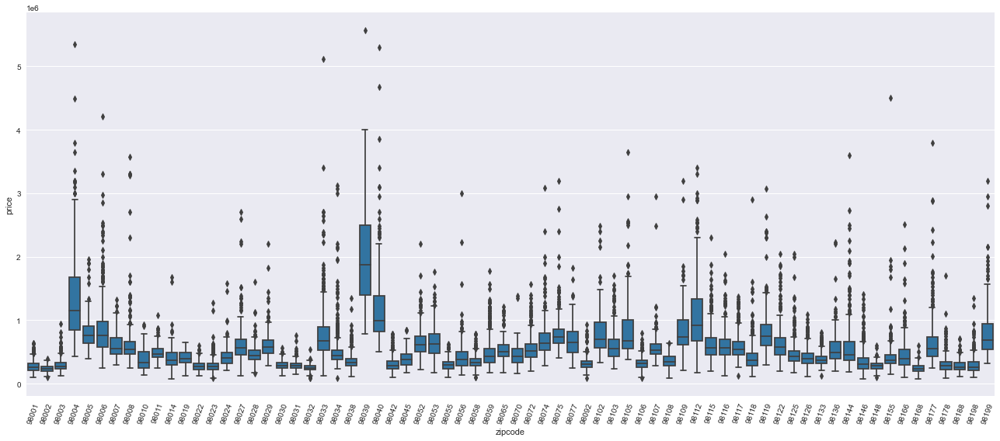

In [195]:
# boxplot showing distributions of sales price by zipcode
plt.figure(figsize=(18,8))
sns.boxplot(data=data, x='zipcode', y='price', color='tab:blue')
plt.xticks(rotation=70)
plt.tight_layout()
plt.show()

In [196]:
# zip_price_sqft = data.groupby('zipcode')['price_per_sqft'].median().reset_index()
# zip_price_sqft

**Latitude**

In [197]:
data['lat'].nunique()

4989

In [198]:
data['lat'].describe()

count    21262.000000
mean        47.561239
std          0.137732
min         47.155900
25%         47.474000
50%         47.572850
75%         47.678300
max         47.777600
Name: lat, dtype: float64

**Longitude**

In [199]:
data['long'].nunique()

720

In [200]:
data['long'].describe()

count    21262.000000
mean      -122.216907
std          0.138386
min       -122.512000
25%       -122.329000
50%       -122.235000
75%       -122.129000
max       -121.315000
Name: long, dtype: float64

In [201]:
# data = data.loc[data['sqft_lot15'] < 500000]

**Checking to see if the distributions of columns are normal or not**

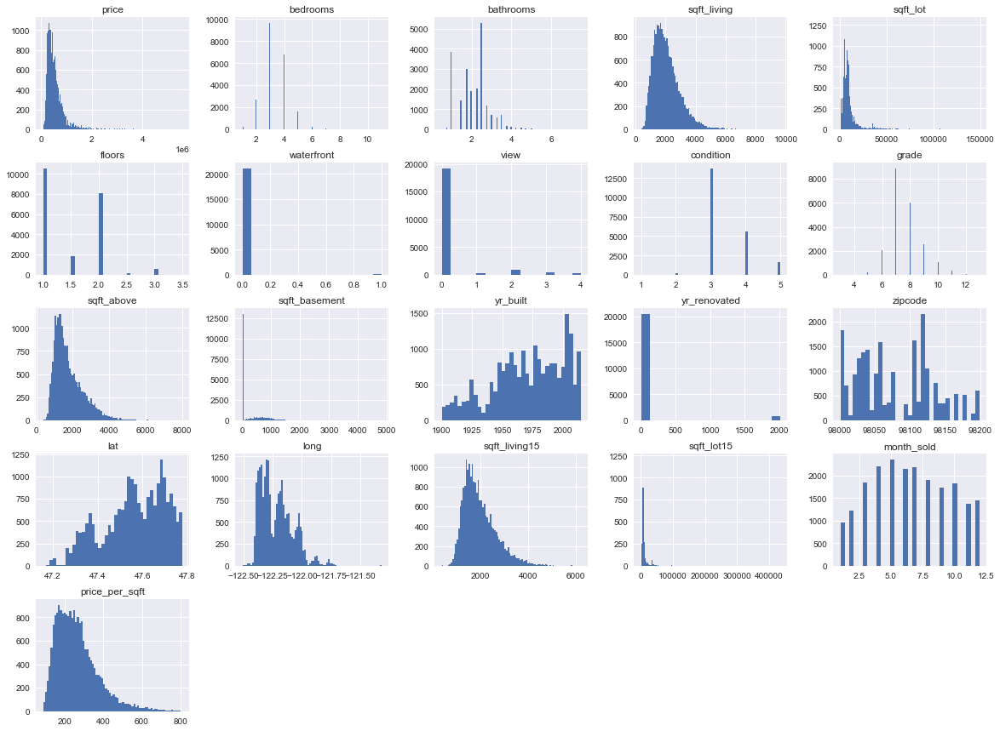

In [202]:
data.hist(figsize=(20, 15), bins='auto');

## Feature Engineering

In [203]:
#create renovated, view, basement, and waterfront to be yes/no
#create new feature for bathrooms per bedroom and price per square foot
data['renovated'] = data['yr_renovated'].astype('bool').astype('int')
data['has_basement'] = data['sqft_basement'].astype('bool').astype('int')
data['waterfront'] = data['waterfront'].astype('bool').astype('int')
data['view'] = data['view'].astype('bool').astype('int')
data['bath_per_bed'] = data['bathrooms'] / data['bedrooms']


In [204]:
data.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'month_sold', 'price_per_sqft',
       'renovated', 'has_basement', 'bath_per_bed'],
      dtype='object')

In [205]:
#dropping yr_renovated and sqft_basement
data = data.drop(['yr_renovated', 'sqft_basement'], axis=1)

In [206]:
# feature groups grades into average, below avg, above avg and excellent. 
# intent of feature is to see whether categorical treatment improves performance over treating grade as continuous
grade_map = lambda x: 'gr0_avg' if x == 7 \
            else 'gr1_below' if x < 7 \
            else 'gr2_above_avg' if x < 11 \
            else 'gr_3_excellent'

data.insert(
    loc=22, column='grade_cat',
    value=data.grade.map(grade_map)
    )

data['grade_cat']=data['grade_cat'].astype('category')

data.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,month_sold,price_per_sqft,renovated,has_basement,bath_per_bed,grade_cat
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,1955,98178,47.5112,-122.257,1340,5650,10,188.050847,0,0,0.333333,gr0_avg
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,1951,98125,47.7210,-122.319,1690,7639,12,209.338521,1,1,0.750000,gr0_avg
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,1933,98028,47.7379,-122.233,2720,8062,2,233.766234,0,0,0.500000,gr1_below
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,1965,98136,47.5208,-122.393,1360,5000,12,308.163265,0,1,0.750000,gr0_avg
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,1987,98074,47.6168,-122.045,1800,7503,2,303.571429,0,0,0.666667,gr2_above_avg


In [207]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21262 entries, 0 to 21596
Data columns (total 23 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   price           21262 non-null  float64 
 1   bedrooms        21262 non-null  int64   
 2   bathrooms       21262 non-null  float64 
 3   sqft_living     21262 non-null  int64   
 4   sqft_lot        21262 non-null  int64   
 5   floors          21262 non-null  float64 
 6   waterfront      21262 non-null  int32   
 7   view            21262 non-null  int32   
 8   condition       21262 non-null  int64   
 9   grade           21262 non-null  int64   
 10  sqft_above      21262 non-null  int64   
 11  yr_built        21262 non-null  int64   
 12  zipcode         21262 non-null  int64   
 13  lat             21262 non-null  float64 
 14  long            21262 non-null  float64 
 15  sqft_living15   21262 non-null  int64   
 16  sqft_lot15      21262 non-null  int64   
 17  month_sold  

In [208]:
#iterate over the continuous data to compare it with the price to see which features 
#we want to explore further by using sns.regplot()
# for col in data.describe().columns:
#      plt.figure(figsize=(8,5))
#      sns.regplot(data=data, x=col, y= 'price', line_kws={'color': 'red'})

In [209]:
# pd.DataFrame(data.corr()['price']).sort_values(by='price',ascending=False)

## Log Transformation

A lot of our features are not normally distributed. We are going to log our features in order to transform to improve the performance of our linear regression models.

In [210]:
#first separate into continuous and categorical columns
continuous = ['sqft_living', 'sqft_living15', 'sqft_lot', 'sqft_lot15',
              'price', 'price_per_sqft', 'bath_per_bed']

categoricals = ['waterfront', 'floors', 'condition', 'grade','renovated', 'view',
             'zipcode', 'bedrooms', 'bathrooms', 'has_basement', 'month_sold', 'grade_cat']

In [211]:
#Transformation non-normal features

kc_cont = data[continuous]

#log features
log_names = [f'{column}_log' for column in kc_cont.columns]

kc_log = np.log(kc_cont)
kc_log.columns = log_names



# normalize (subract mean and divide by std)

def normalize(feature):
    return (feature - feature.mean()) / feature.std()

kc_log_norm =kc_log.apply(normalize)

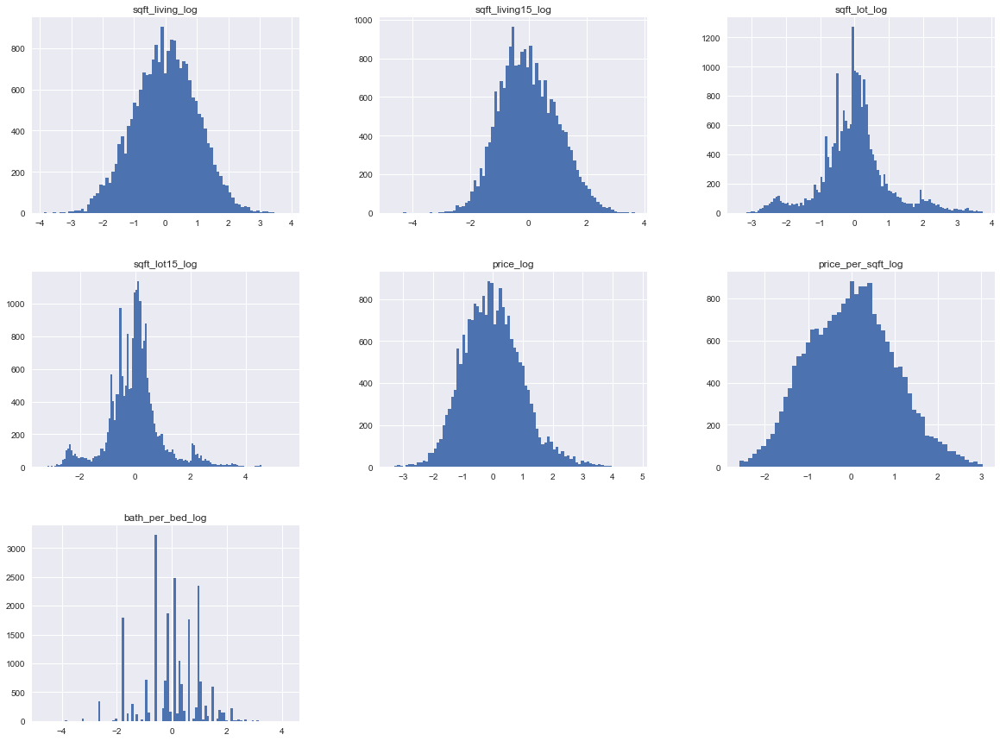

In [212]:
kc_log_norm.hist(figsize=(20, 15), bins='auto');

This is much better, we are going to use this for our models later on.

In [213]:
# zip_price_sqft['price_per_sqft'].hist()

In [214]:
# zip_price_sqft

In [215]:
#normalize
# zip_norm = zip_price_sqft.apply(normalize)

In [216]:
# zip_log = np.log(zip_norm)
# zip_log.isna()

In [217]:
# predictors = ['zipcode', 'price_per_sqft']
# for value in predictors:
#      median=zip_log[value].median()
#      zip_log[value].fillna(median, inplace=True)
    
# zip_log

In [218]:
kc_clean = pd.concat([kc_log_norm, data], axis=1)

In [219]:
kc_clean.head()

,sqft_living_log,sqft_living15_log,sqft_lot_log,sqft_lot15_log,price_log,price_per_sqft_log,bath_per_bed_log,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,month_sold,price_per_sqft,renovated,has_basement,bath_per_bed,grade_cat
0,-1.120864,-1.026547,-0.371811,-0.378983,-1.396201,-0.660233,-1.757192,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,1955,98178,47.5112,-122.257,1340,5650,10,188.050847,0,0,0.333333,gr0_avg
1,0.726623,-0.317015,-0.060629,0.029533,0.289332,-0.389329,0.633977,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,1951,98125,47.7210,-122.319,1690,7639,12,209.338521,1,1,0.750000,gr0_avg
2,-2.134047,1.138083,0.343875,0.102531,-1.794484,-0.110522,-0.561608,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,1933,98028,47.7379,-122.233,2720,8062,2,233.766234,0,0,0.500000,gr1_below
3,0.083505,-0.981249,-0.525017,-0.544521,0.509561,0.587472,0.633977,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,1965,98136,47.5208,-122.393,1360,5000,12,308.163265,0,1,0.750000,gr0_avg
4,-0.282367,-0.124212,0.076627,0.005202,0.187610,0.549547,0.286673,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,1987,98074,47.6168,-122.045,1800,7503,2,303.571429,0,0,0.666667,gr2_above_avg


In [220]:
kc_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21262 entries, 0 to 21596
Data columns (total 30 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   sqft_living_log     21262 non-null  float64 
 1   sqft_living15_log   21262 non-null  float64 
 2   sqft_lot_log        21262 non-null  float64 
 3   sqft_lot15_log      21262 non-null  float64 
 4   price_log           21262 non-null  float64 
 5   price_per_sqft_log  21262 non-null  float64 
 6   bath_per_bed_log    21262 non-null  float64 
 7   price               21262 non-null  float64 
 8   bedrooms            21262 non-null  int64   
 9   bathrooms           21262 non-null  float64 
 10  sqft_living         21262 non-null  int64   
 11  sqft_lot            21262 non-null  int64   
 12  floors              21262 non-null  float64 
 13  waterfront          21262 non-null  int32   
 14  view                21262 non-null  int32   
 15  condition           21262 non-null  

In [221]:
corr = kc_clean.corr()
corr

,sqft_living_log,sqft_living15_log,sqft_lot_log,sqft_lot15_log,price_log,price_per_sqft_log,bath_per_bed_log,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,month_sold,price_per_sqft,renovated,has_basement,bath_per_bed
sqft_living_log,1.000000,0.748694,0.324262,0.296379,0.670545,-0.174302,0.332299,0.613291,0.640103,0.759056,0.958334,0.229035,0.364545,0.079068,0.237454,-0.046734,0.739556,0.830806,0.346013,-0.218830,0.043074,0.248865,0.738708,0.165926,0.013207,-0.174787,0.046236,0.236599,0.295507
sqft_living15_log,0.748694,1.000000,0.375449,0.378827,0.606480,0.008136,0.301451,0.550860,0.420605,0.573059,0.739759,0.266120,0.274282,0.077307,0.260944,-0.087597,0.691588,0.707514,0.332008,-0.287818,0.046336,0.333199,0.976869,0.209272,0.002041,0.013946,-0.003523,0.064576,0.260676
sqft_lot_log,0.324262,0.375449,1.000000,0.913769,0.121884,-0.183342,-0.108746,0.157705,0.213700,0.078326,0.340059,0.790524,-0.284748,0.082562,0.102776,0.099581,0.172428,0.316712,-0.037209,-0.277906,-0.134348,0.345891,0.377745,0.601032,-0.000064,-0.173576,0.018498,-0.040411,-0.133863
sqft_lot15_log,0.296379,0.378827,0.913769,1.000000,0.107856,-0.172285,-0.089970,0.144184,0.183655,0.072692,0.313545,0.719996,-0.265786,0.092139,0.097901,0.101635,0.175091,0.296796,-0.006216,-0.274283,-0.129621,0.348296,0.383160,0.715948,-0.003582,-0.163250,0.017864,-0.047400,-0.114595
price_log,0.670545,0.606480,0.121884,0.107856,1.000000,0.613635,0.309750,0.900520,0.349711,0.545014,0.693242,0.127611,0.307702,0.170785,0.330707,0.042325,0.700309,0.595563,0.073634,-0.033946,0.458959,0.039996,0.618529,0.079861,-0.012342,0.587931,0.106779,0.212044,0.296904
price_per_sqft_log,-0.174302,0.008136,-0.183342,-0.172285,0.613635,1.000000,0.057461,0.542532,-0.217102,-0.084479,-0.099830,-0.074387,0.020423,0.142530,0.186224,0.105919,0.142400,-0.093749,-0.270535,0.187850,0.563338,-0.211785,0.034756,-0.070599,-0.030438,0.966400,0.092519,0.029631,0.079569
bath_per_bed_log,0.332299,0.301451,-0.108746,-0.089970,0.309750,0.057461,1.000000,0.274864,-0.209387,0.685060,0.328875,0.028941,0.419593,0.061993,0.112525,-0.151546,0.422035,0.325657,0.453140,-0.109836,0.038066,0.142099,0.295128,0.029134,0.014432,0.045255,0.035594,0.066769,0.969673
price,0.613291,0.550860,0.157705,0.144184,0.900520,0.542532,0.274864,1.000000,0.316357,0.519050,0.697540,0.130619,0.256557,0.265246,0.360838,0.040395,0.671362,0.597871,0.050350,-0.050330,0.317800,0.013512,0.591773,0.084252,-0.009949,0.565145,0.114131,0.181684,0.276107
bedrooms,0.640103,0.420605,0.213700,0.183655,0.349711,-0.217102,-0.209387,0.316357,1.000000,0.527016,0.598231,0.087905,0.181650,-0.002546,0.081828,0.023081,0.365986,0.495484,0.161747,-0.160074,-0.012159,0.139127,0.406411,0.047949,-0.001005,-0.213304,0.017281,0.159148,-0.240448
bathrooms,0.759056,0.573059,0.078326,0.072692,0.545014,-0.084479,0.685060,0.519050,0.527016,1.000000,0.750773,0.099844,0.503262,0.064125,0.172667,-0.126324,0.661459,0.680672,0.508934,-0.203987,0.025601,0.221305,0.570016,0.069731,0.008903,-0.091629,0.045080,0.159691,0.652303


In [222]:
# correlation matrix for just price
corr['price'].sort_values(ascending=False)

price                 1.000000
price_log             0.900520
sqft_living           0.697540
grade                 0.671362
sqft_living_log       0.613291
sqft_above            0.597871
sqft_living15         0.591773
price_per_sqft        0.565145
sqft_living15_log     0.550860
price_per_sqft_log    0.542532
bathrooms             0.519050
view                  0.360838
lat                   0.317800
bedrooms              0.316357
bath_per_bed          0.276107
bath_per_bed_log      0.274864
waterfront            0.265246
floors                0.256557
has_basement          0.181684
sqft_lot_log          0.157705
sqft_lot15_log        0.144184
sqft_lot              0.130619
renovated             0.114131
sqft_lot15            0.084252
yr_built              0.050350
condition             0.040395
long                  0.013512
month_sold           -0.009949
zipcode              -0.050330
Name: price, dtype: float64

## Multicollinearity

In [223]:
# check for collinearity among potential predictors by pairs
df = (
     corr
     .stack()
     .reset_index()
     .sort_values(0, ascending=False)
)
# zip the default name columns level_0 and level_1
df['pairs'] = list(zip(df.level_0, df.level_1))
# set index to pairs
df.set_index(['pairs'], inplace=True)
# now drop level columns
df.drop(columns=['level_1', 'level_0'], inplace=True)
# rename correlation column rather than 0
df.columns = ['correlation']
# drop duplicates and keep only pair correlations above 0.65
df.drop_duplicates(inplace=True)
df[abs(df.correlation) > .65]

,correlation
pairs,
"(sqft_living_log, sqft_living_log)",1.000000
"(sqft_living15, sqft_living15_log)",0.976869
"(bath_per_bed_log, bath_per_bed)",0.969673
"(price_per_sqft, price_per_sqft_log)",0.966400
"(sqft_living, sqft_living_log)",0.958334
"(sqft_lot_log, sqft_lot15_log)",0.913769
"(price_log, price)",0.900520
"(sqft_above, sqft_living)",0.871959
"(sqft_living_log, sqft_above)",0.830806


**Observations on Multicollinearity:**

1. Disregard the log columns compared to the original columns.
2. Will not need sqft_living and sqft_above since they are over .87.
3. Will keep grade and sqft_living since one of the variables is independent of the other.

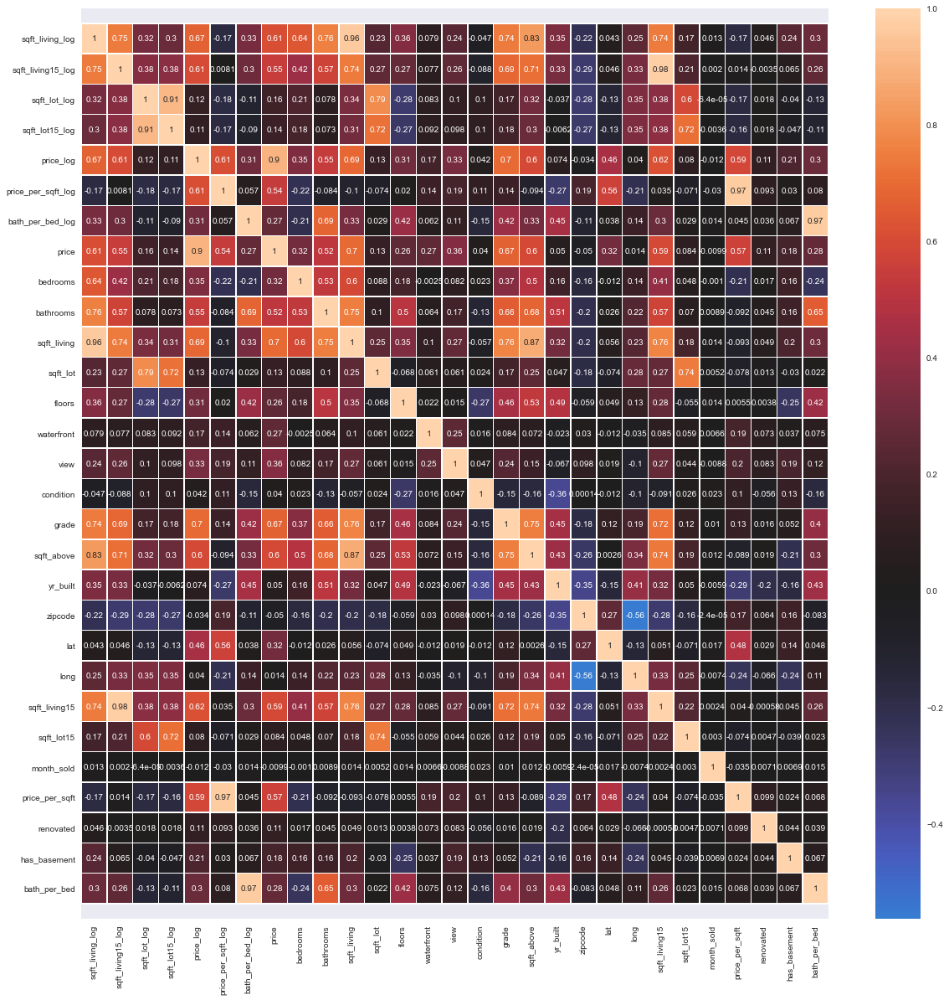

In [224]:
#Heat map
plt.figure(figsize=(20, 20))
ax = sns.heatmap(kc_clean.corr(), center=0, linewidths=.5, annot=True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.show()

In [225]:
# # Creating VIF Dictionary.
def create_vif_dct(dataframe, const_col_name='const'):
    
    if const_col_name not in dataframe.columns:
        dataframe = sm.add_constant(dataframe)
        
    # Dummy-checking.
    df = dataframe.select_dtypes('number')
    if df.shape != dataframe.shape:
        warnings.warn('\n\nThere are non-numerical columns trying to be passed!\nThese have automatically been removed.\n')
    if df.isna().sum().any():
        raise ValueError('There may not be any missing values in the dataframe!')
        
    # Creating VIF Dictionary.
    vif_dct = {}

    # Loop through each row and set the variable name to the VIF. 
    for i in range(len(df.columns)):
        vif = variance_inflation_factor(df.values, i)
        v = df.columns[i]
        vif_dct[v] = vif

    return vif_dct

In [226]:
create_vif_dct(kc_clean)

{'const': 4830904.04291405,
 'sqft_living_log': inf,
 'sqft_living15_log': 31.98783424848917,
 'sqft_lot_log': 12.782377647451998,
 'sqft_lot15_log': 10.213091263151094,
 'price_log': inf,
 'price_per_sqft_log': inf,
 'bath_per_bed_log': 26.36273623980796,
 'price': 10.102364477003192,
 'bedrooms': 11.97543929576719,
 'bathrooms': 22.316364259630156,
 'sqft_living': 32.792597348091974,
 'sqft_lot': 5.067635544460165,
 'floors': 2.848609818861618,
 'waterfront': 1.194056685116277,
 'view': 1.3240671328697278,
 'condition': 1.302698149712884,
 'grade': 4.04519181767723,
 'sqft_above': 15.865124778265933,
 'yr_built': 2.6693924814483587,
 'zipcode': 1.7187146227420946,
 'lat': 1.9717136398547268,
 'long': 1.920182030444781,
 'sqft_living15': 33.714397756829264,
 'sqft_lot15': 3.5910043619671557,
 'month_sold': 1.0072702533673816,
 'price_per_sqft': 21.080570868036155,
 'renovated': 1.1276549634553072,
 'has_basement': 3.512006860095768,
 'bath_per_bed': 19.063005513924868}

In [227]:
# ohe_categoricals = ['waterfront', 'floors', 'condition', 'grade','renovated', 'view',
#              'zipcode', 'bedrooms', 'bathrooms', 'has_basement', 'month_sold', 'grade_cat']

In [228]:
#convert the ints into floats per the error when trying to run the model
# kc_clean['bedrooms']=kc_clean['bedrooms'].astype('int').astype('float')
# kc_clean['sqft_living']=kc_clean['sqft_living'].astype('int').astype('float')
# kc_clean['sqft_lot']=kc_clean['sqft_lot'].astype('int').astype('float')
# kc_clean['waterfront']=kc_clean['waterfront'].astype('int').astype('float')
# kc_clean['view']=kc_clean['view'].astype('int').astype('float')
# kc_clean['condition']=kc_clean['condition'].astype('int').astype('float')
# kc_clean['grade']=kc_clean['grade'].astype('int').astype('float')
# kc_clean['sqft_living15']=kc_clean['sqft_living15'].astype('int').astype('float')
# kc_clean['sqft_lot15']=kc_clean['sqft_lot15'].astype('int').astype('float')
# kc_clean['month_sold']=kc_clean['month_sold'].astype('int').astype('float')
# kc_clean['renovated']=kc_clean['renovated'].astype('int').astype('float')
# kc_clean['has_basement']=kc_clean['has_basement'].astype('int').astype('float')

## OHE

In [229]:

# Convert category variables data type
categoricals= ['zipcode','grade_cat']
kc_clean['zipcode']=kc_clean['zipcode'].astype(int).astype('category')

In [230]:
# create one-hot encoded variables for categoricals
kc_ohe = pd.get_dummies(kc_clean[categoricals], drop_first=True)
kc_ohe.head()

,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199,grade_cat_gr1_below,grade_cat_gr2_above_avg,grade_cat_gr_3_excellent
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [231]:
# concatenate OHE columns with original dataframe, and drop some some columns not needed
kc_comb = pd.concat([kc_clean, kc_ohe], axis=1)
kc_comb.drop(['lat','long', 'yr_built', 'grade_cat'], axis=1, inplace=True)
kc_comb.head()

,sqft_living_log,sqft_living15_log,sqft_lot_log,sqft_lot15_log,price_log,price_per_sqft_log,bath_per_bed_log,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,zipcode,sqft_living15,sqft_lot15,month_sold,price_per_sqft,renovated,has_basement,bath_per_bed,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,...,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199,grade_cat_gr1_below,grade_cat_gr2_above_avg,grade_cat_gr_3_excellent
0,-1.120864,-1.026547,-0.371811,-0.378983,-1.396201,-0.660233,-1.757192,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,98178,1340,5650,10,188.050847,0,0,0.333333,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,0.726623,-0.317015,-0.060629,0.029533,0.289332,-0.389329,0.633977,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,98125,1690,7639,12,209.338521,1,1,0.750000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,-2.134047,1.138083,0.343875,0.102531,-1.794484,-0.110522,-0.561608,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,98028,2720,8062,2,233.766234,0,0,0.500000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0.083505,-0.981249,-0.525017,-0.544521,0.509561,0.587472,0.633977,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,98136,1360,5000,12,308.163265,0,1,0.750000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,-0.282367,-0.124212,0.076627,0.005202,0.187610,0.549547,0.286673,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,98074,1800,7503,2,303.571429,0,0,0.666667,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


## Train-Test Split

In [232]:
# # divide dataset into X predictors and y target
X = kc_comb.drop(['price_log', 'price_per_sqft_log', 'price', 'price_per_sqft'], axis=1)
y = kc_comb[['price_log', 'price_per_sqft_log', 'price', 'price_per_sqft']]

In [233]:
# split data 80% training and 20% test w/ random state for reproducability
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((15946, 94), (5316, 94), (15946, 4), (5316, 4))

In [234]:
X_test.head()

,sqft_living_log,sqft_living15_log,sqft_lot_log,sqft_lot15_log,bath_per_bed_log,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,zipcode,sqft_living15,sqft_lot15,month_sold,renovated,has_basement,bath_per_bed,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,...,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199,grade_cat_gr1_below,grade_cat_gr2_above_avg,grade_cat_gr_3_excellent
14214,0.642015,0.057152,-0.067920,0.315106,-0.024001,5,3.00,2480,7200,1.0,0,0,3,7,1560,98188,1910,9432,4,0,1,0.600000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1733,0.504098,-0.245490,-0.874325,-0.846757,0.096370,4,2.50,2340,3784,2.0,0,0,3,8,2340,98106,1730,4000,6,0,0,0.625000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
372,0.335995,-0.107272,0.434999,-0.102595,-0.214304,4,2.25,2180,10754,1.0,0,0,5,7,1100,98133,1810,6929,3,0,1,0.562500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1721,-0.079383,-1.072526,2.406585,2.611612,-0.107068,3,1.75,1830,51836,1.0,0,0,4,7,1430,98059,1320,51400,9,0,1,0.583333,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
13772,-0.015404,-0.263215,0.980477,0.158158,-1.613326,5,1.75,1880,16617,1.0,0,0,3,7,960,98007,1720,8400,4,0,1,0.350000,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [235]:
# Scale the training set
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

In [236]:
#Transform the test data (X_test) using the same scaler:
X_test_scaled = scaler.transform(X_test)

In [237]:
#turn into dataframes
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

In [238]:
X_train_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15946 entries, 0 to 15945
Data columns (total 94 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   sqft_living_log           15946 non-null  float64
 1   sqft_living15_log         15946 non-null  float64
 2   sqft_lot_log              15946 non-null  float64
 3   sqft_lot15_log            15946 non-null  float64
 4   bath_per_bed_log          15946 non-null  float64
 5   bedrooms                  15946 non-null  float64
 6   bathrooms                 15946 non-null  float64
 7   sqft_living               15946 non-null  float64
 8   sqft_lot                  15946 non-null  float64
 9   floors                    15946 non-null  float64
 10  waterfront                15946 non-null  float64
 11  view                      15946 non-null  float64
 12  condition                 15946 non-null  float64
 13  grade                     15946 non-null  float64
 14  sqft_a

In [239]:
X_train_scaled.shape, y_train.shape

((15946, 94), (15946, 4))

## Functions for Modeling

**Checking Heteroscadasticity**

In [240]:
# function to generate residuals for each independent variable in an OLS model
def plot_residuals(model_nbr, model):
    """
    Displays residual plots for each predictor (X) in a statsmodel OLS object for 
    testing normality of model residuals on specific features.
    
    Parameters:
    model_nbr (int): sequence number you've created for model iteration
    model (linear_model): statsmodel fitted OLS model object

   """    
    
    # loop through variables to show residuals for each
    x_vars = model.params.keys().tolist()
    x_vars.remove('const')

    for x in x_vars:
        f = plt.figure(figsize=(15,8))
        f = sm.graphics.plot_regress_exog(model, x, fig=f)   
        f.tight_layout()
        plt.show()

In [241]:
# normalize a feature (subract mean and divide by std)
def normalize(feature):
    return (feature - feature.mean()) / feature.std()

#denormalize (add mean and multiple by std)
def denormalize(feature, log_df):
    return log_df['price_log'].std()*feature + log_df['price_log'].mean()

In [242]:

# function using K-folds cross-validation to validate OLS model
def kfolds(X, y, cv=5):
    """
    
    Performs cross-validation using cv number of folds against full 
    sample X and y. Prints out CV mean absolute errors for comparison 
    to OLS model MAE.
    
    Parameters:
    X (pd.DataFrame): full sample contains model predictors
    y (pd.DataFrame)): full sample contains model target

   """
    
    model = LinearRegression()
    model.fit(X, y)
    mae = make_scorer(mean_absolute_error)
    cv_5_results = cross_val_score(model, X, y, cv=cv, scoring=mae)
    print(f'Cross-Validation MAE results: {cv_5_results} | CV MAE Mean: {cv_5_results.mean()}')

In [243]:
#run this code before modeling to see what features to build model off of
create_vif_dct(X_train_scaled)

{'const': 185.8207846863206,
 'sqft_living_log': 24.549795184743108,
 'sqft_living15_log': 34.93366443503699,
 'sqft_lot_log': 13.221449492216815,
 'sqft_lot15_log': 10.947664227947772,
 'bath_per_bed_log': 26.451133171322105,
 'bedrooms': 12.10565114648051,
 'bathrooms': 21.983431884722705,
 'sqft_living': 31.213783451730254,
 'sqft_lot': 5.313825676123974,
 'floors': 2.920035384470976,
 'waterfront': 1.1044066555433274,
 'view': 1.3468287312549543,
 'condition': 1.2052925838185926,
 'grade': 9.625922301727082,
 'sqft_above': 16.40847047980705,
 'zipcode': inf,
 'sqft_living15': 37.02746175824402,
 'sqft_lot15': 3.8508475960947908,
 'month_sold': 1.0084322175728675,
 'renovated': 1.0540286218573853,
 'has_basement': 3.6103999834832132,
 'bath_per_bed': 19.182614638988667,
 'zipcode_98002': inf,
 'zipcode_98003': inf,
 'zipcode_98004': inf,
 'zipcode_98005': inf,
 'zipcode_98006': inf,
 'zipcode_98007': inf,
 'zipcode_98008': inf,
 'zipcode_98010': inf,
 'zipcode_98011': inf,
 'zipcode

# Modeling

## Model 1

First model will include features that are highly correlated minus the logged features.

In [244]:
# model 1 setup and call statsmodel function
features_m1 = ['sqft_living', 'sqft_above', 'sqft_living15', 'bathrooms', 'bedrooms']

# apply features to X_train and chose which y to predict
X_train_m1 = sm.add_constant(X_train[features_m1])
y_train_m1 = y_train['price']

# apply features to X_test and chose which y to predict
X_test_m1 = sm.add_constant(X_test[features_m1])
y_test_m1 = y_test['price']

# quick check of rows
X_train_m1.head()

,const,sqft_living,sqft_above,sqft_living15,bathrooms,bedrooms
629,1.0,3250,3250,3110,2.25,4
7185,1.0,1440,1090,1710,1.75,3
1329,1.0,2690,1870,2690,2.25,2
1029,1.0,1190,1190,1190,2.00,4
15436,1.0,2680,2680,1940,2.25,3


In [245]:
y_train_m1.head()

629      480000.0
7185     260000.0
1329     515000.0
1029     900000.0
15436    590000.0
Name: price, dtype: float64

In [246]:
model_1 = sm.OLS(y_train_m1, X_train_m1).fit()
model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.515
Model:                            OLS   Adj. R-squared:                  0.514
Method:                 Least Squares   F-statistic:                     3380.
Date:                Fri, 05 Nov 2021   Prob (F-statistic):               0.00
Time:                        09:14:43   Log-Likelihood:            -2.2077e+05
No. Observations:               15946   AIC:                         4.415e+05
Df Residuals:                   15940   BIC:                         4.416e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          3.247e+04   8916.937      3.642      0.000     1.5e+04    4.99e+04
sqft_living     303.0377      5.613     53.987      0.000     292.035     314.040
sqft_above      -43.8954      5.141     -8.538      0.000     -53.973     -33.818
sqft_living15    72.5685      4.594     15.795      0.000      63.563      81.574
bathrooms      8405.1631   3988.589      2.107      0.035     587.078    1.62e+04
bedrooms      -6.059e+04   2778.357    -21.809      0.000    -6.6e+04   -5.51e+04
==============================================================================
Omnibus:                     8958.089   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           161944.662
Skew:                           2.321   Prob(JB):                         0.00
Kurtosis:                      17.906   Cond. No.                     1.67e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.67e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

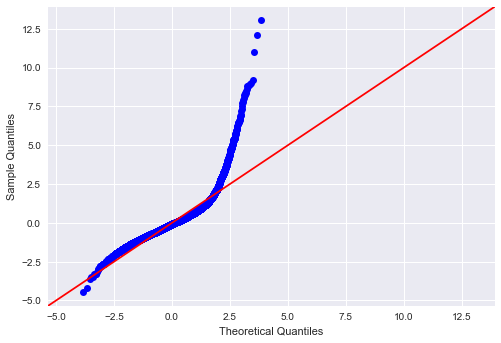

In [247]:
#normal distribution
# plot the overall residuals via QQ-plot
sm.graphics.qqplot(model_1.resid, dist=stats.norm, line='45', fit=True);

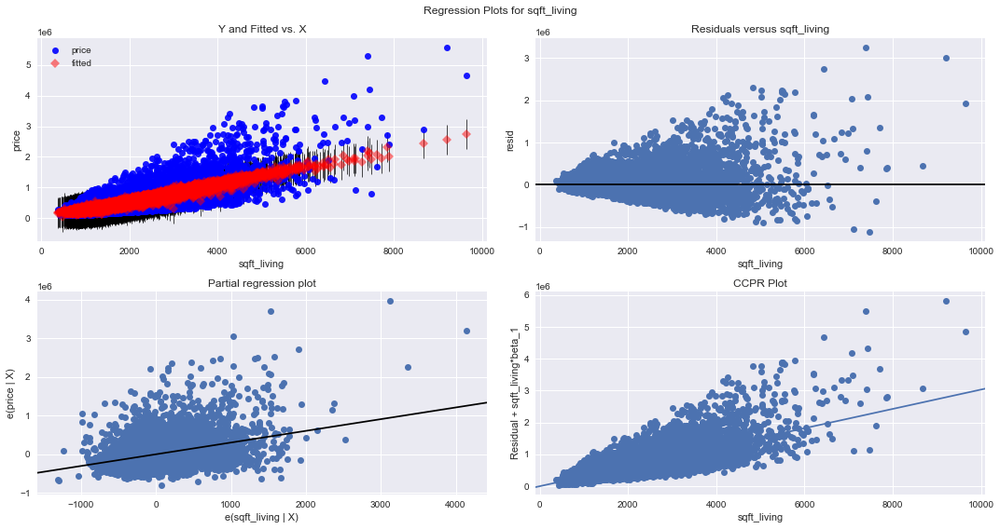

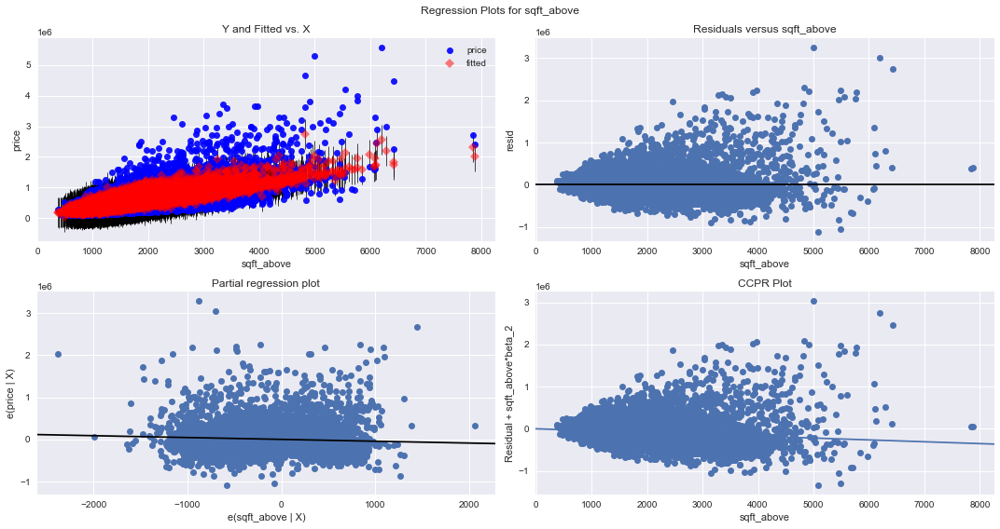

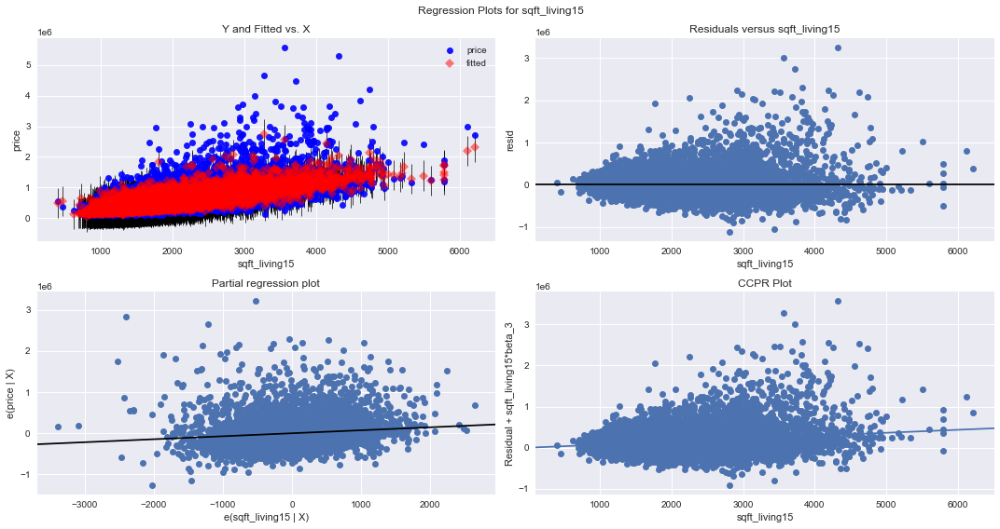

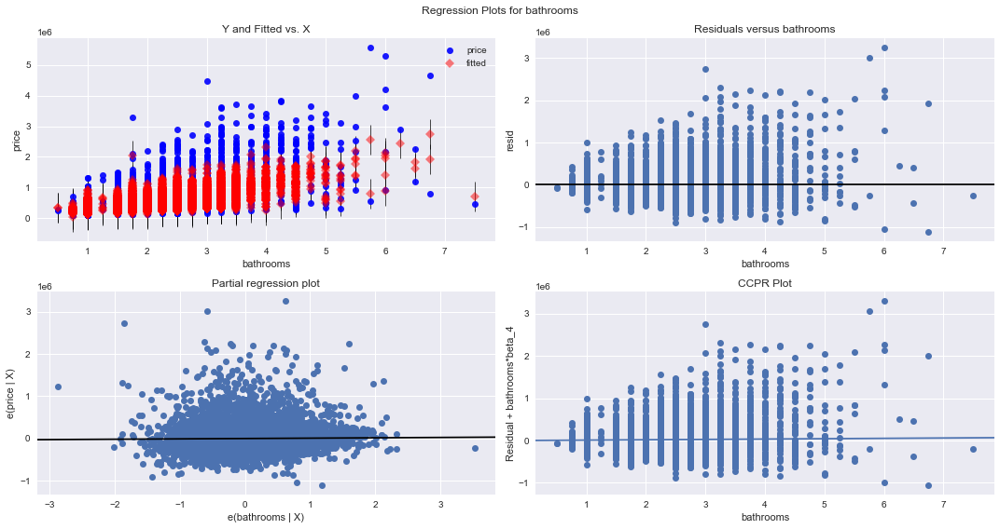

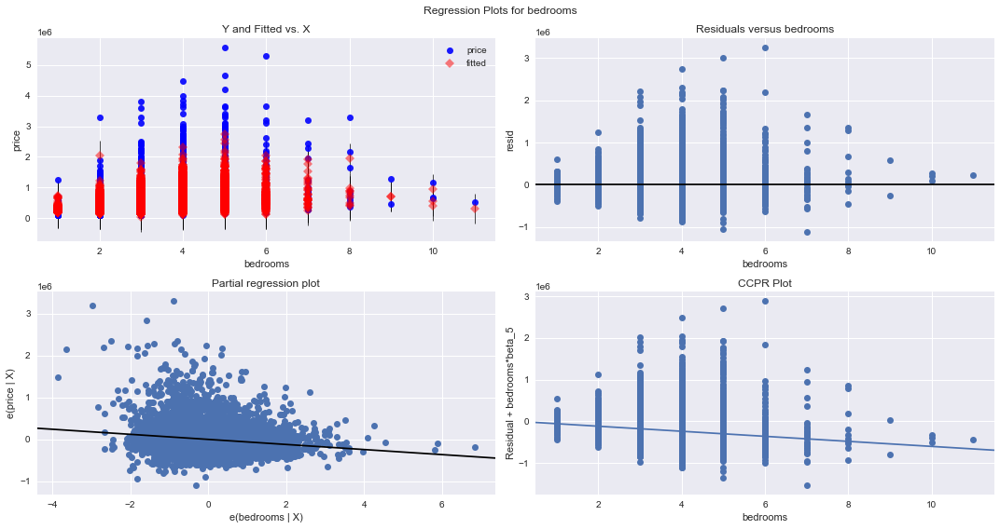

In [248]:
plot_residuals(model_nbr=1, model=model_1)

In [249]:
# cross validation to compare MAE on entire sample for m1 features
X_CV_m1 = X[features_m1]
y_CV_m1 = y['price']

kfolds(X_CV_m1, y_CV_m1, cv=5)

Cross-Validation MAE results: [169261.21119959 165288.78252434 161886.99857286 167142.35650135
 177860.35018324] | CV MAE Mean: 168287.93979627627


In [250]:

# Fit model with training data.
linreg = LinearRegression()
linreg.fit(X_train_m1, y_train_m1)

LinearRegression()

In [251]:
linreg.predict(X_test_m1)

array([ 576384.39980089,  543048.85462367,  552697.27711244, ...,
       1404221.15475195,  585812.86719832,  350189.39960564])

In [252]:
linreg.score(X_test_m1, y_test_m1)

0.5022980539067426

In [253]:
y_pred_train = linreg.predict (X_train_m1)
y_pred_test = linreg.predict(X_test_m1)

In [254]:
mae = metrics.mean_absolute_error(y_train_m1, y_pred_train)
mse = metrics.mean_squared_error(y_train_m1, y_pred_train)
rmse = np.sqrt(mse)  
r2 = metrics.r2_score(y_train_m1, y_pred_train)

print("Results of Model 1:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of Model 1:
MAE: 167485.5169524228
MSE: 62055413402.81312
RMSE: 249109.23989850943
R-Squared: 0.5145946437962563


## Model 2

Model 2 will include highly correlated logged features

In [255]:
features_m2 = ['sqft_living_log', 'sqft_living15_log', 'sqft_lot_log', 'sqft_lot15_log', 
               'bath_per_bed_log']

# apply features to X_train and chose which y to predict
X_train_m2 = sm.add_constant(X_train[features_m2])
y_train_m2 = y_train['price_log']

# apply features to X_test and chose which y to predict
X_test_m2 = sm.add_constant(X_test[features_m2])
y_test_m2 = y_test['price_log']

# quick check of rows
X_train_m2.head()

,const,sqft_living_log,sqft_living15_log,sqft_lot_log,sqft_lot15_log,bath_per_bed_log
629,1.0,1.283792,1.547767,1.888690,2.128590,-0.214304
7185,1.0,-0.648238,-0.281044,0.661914,0.737949,-0.107068
1329,1.0,0.834936,1.104173,0.852144,0.943491,1.829561
1029,1.0,-1.100834,-1.389528,0.093578,-2.116051,-0.561608
15436,1.0,0.826097,0.104803,2.120233,2.491669,0.633977


In [256]:
model_2 = sm.OLS(y_train_m2, X_train_m2).fit()
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.497
Model:                            OLS   Adj. R-squared:                  0.496
Method:                 Least Squares   F-statistic:                     3145.
Date:                Fri, 05 Nov 2021   Prob (F-statistic):               0.00
Time:                        09:14:49   Log-Likelihood:                -17184.
No. Observations:               15946   AIC:                         3.438e+04
Df Residuals:                   15940   BIC:                         3.443e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.0022      0.006      0.383      0.702      -0.009       0.013
sqft_living_log       0.4911      0.009     56.346      0.000       0.474       0.508
sqft_living15_log     0.2806      0.009     31.666      0.000       0.263       0.298
sqft_lot_log         -0.0557      0.014     -3.913      0.000      -0.084      -0.028
sqft_lot15_log       -0.0878      0.014     -6.215      0.000      -0.116      -0.060
bath_per_bed_log      0.0470      0.006      7.536      0.000       0.035       0.059
==============================================================================
Omnibus:                       51.782   Durbin-Watson:                   1.991
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               46.250
Skew:                           0.089   Prob(JB):                     9.06e-11
Kurtosis:                       2.805   Cond. No.                         5.55
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

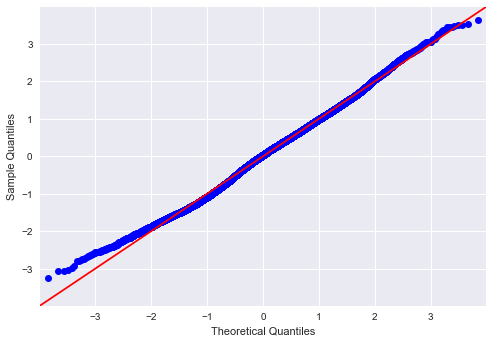

In [257]:
sm.graphics.qqplot(model_2.resid, dist=stats.norm, line='45', fit=True);

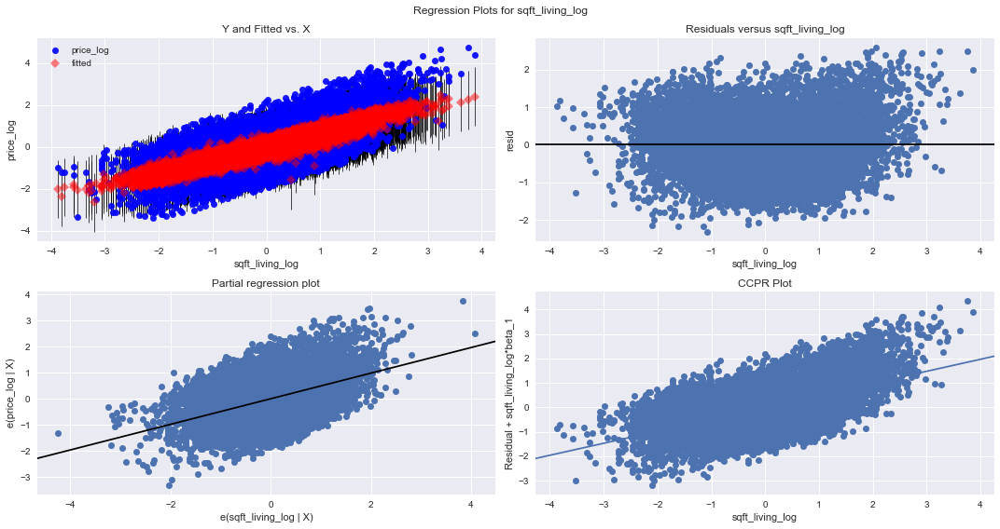

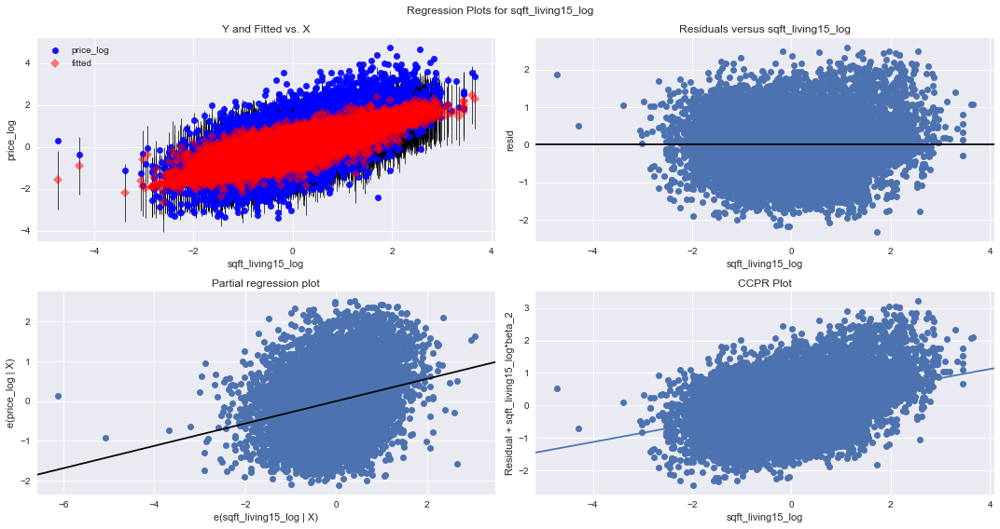

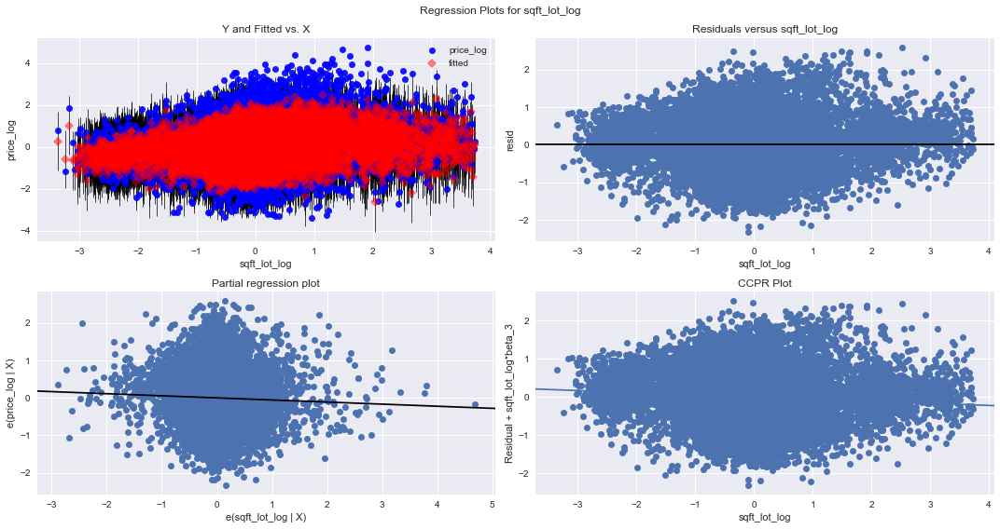

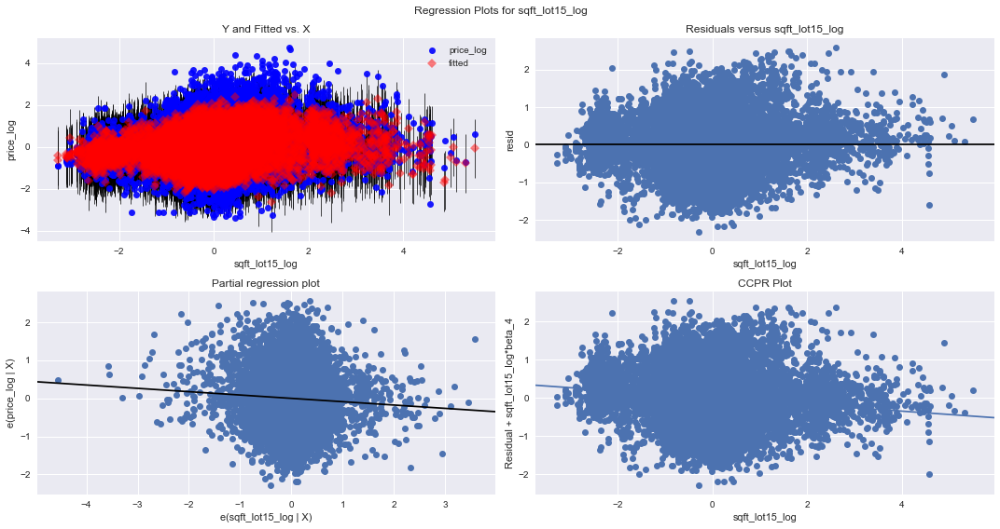

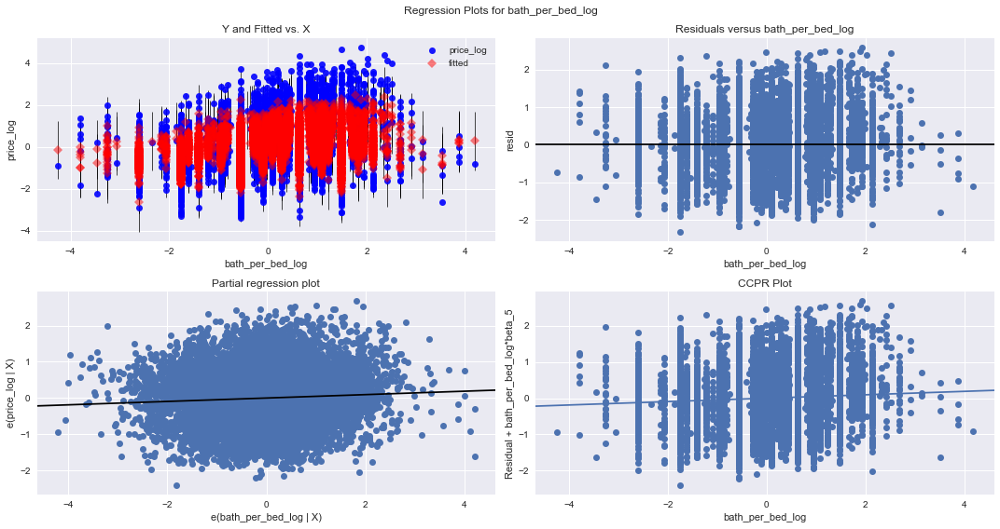

In [258]:
plot_residuals(model_nbr=1, model=model_2)

In [259]:
# cross validation to compare MAE on entire sample for m1 features
X_CV_m2 = X[features_m2]
y_CV_m2 = y['price_log']

kfolds(X_CV_m2, y_CV_m2, cv=5)

Cross-Validation MAE results: [0.57860893 0.57001188 0.56959574 0.57583201 0.57492629] | CV MAE Mean: 0.5737949700964913


## Model 3

In [260]:
# model 3 setup and call statsmodel function
features_m3 = ['sqft_living_log', 'grade', 'view', 'renovated', 
               'waterfront', 'has_basement', 'condition'] 

# apply features to X_train and chose which y to predict
X_train_m3 = sm.add_constant(X_train[features_m3])
y_train_m3 = y_train['price_log']

# apply features to X_test and chose which y to predict
X_test_m3 = sm.add_constant(X_test[features_m3])
y_test_m3 = y_test['price_log']

# quick check of rows
X_train_m3.head()

,const,sqft_living_log,grade,view,renovated,waterfront,has_basement,condition
629,1.0,1.283792,9,0,0,0,0,4
7185,1.0,-0.648238,7,1,0,0,1,3
1329,1.0,0.834936,8,1,0,0,1,3
1029,1.0,-1.100834,7,0,0,0,0,3
15436,1.0,0.826097,7,0,0,0,0,3


In [261]:
model_3 = sm.OLS(y_train_m3, X_train_m3).fit()
model_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.594
Model:                            OLS   Adj. R-squared:                  0.594
Method:                 Least Squares   F-statistic:                     3333.
Date:                Fri, 05 Nov 2021   Prob (F-statistic):               0.00
Time:                        09:14:55   Log-Likelihood:                -15468.
No. Observations:               15946   AIC:                         3.095e+04
Df Residuals:                   15938   BIC:                         3.101e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -3.9176      0.062    -62.802      0.000      -4.040      -3.795
sqft_living_log     0.2615      0.008     33.086      0.000       0.246       0.277
grade               0.4198      0.007     62.372      0.000       0.407       0.433
view                0.3802      0.019     20.415      0.000       0.344       0.417
renovated           0.4276      0.027     15.558      0.000       0.374       0.481
waterfront          0.8166      0.067     12.227      0.000       0.686       0.948
has_basement        0.1697      0.011     15.306      0.000       0.148       0.191
condition           0.1724      0.008     21.618      0.000       0.157       0.188
==============================================================================
Omnibus:                        5.516   Durbin-Watson:                   2.009
Prob(Omnibus):                  0.063   Jarque-Bera (JB):                5.533
Skew:                           0.045   Prob(JB):                       0.0629
Kurtosis:                       2.987   Cond. No.                         113.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

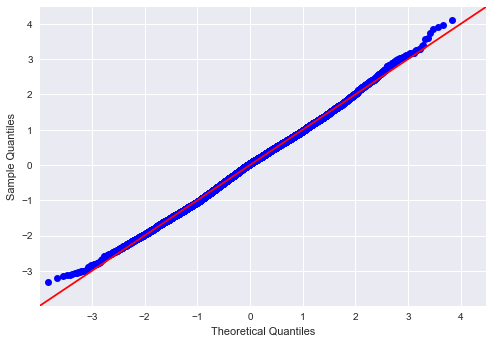

In [262]:
sm.graphics.qqplot(model_3.resid, dist=stats.norm, line='45', fit=True);

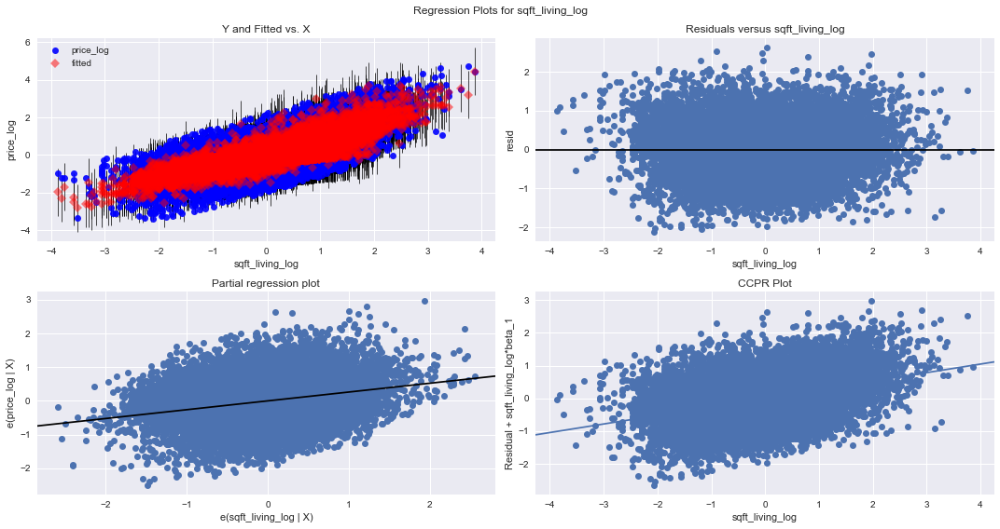

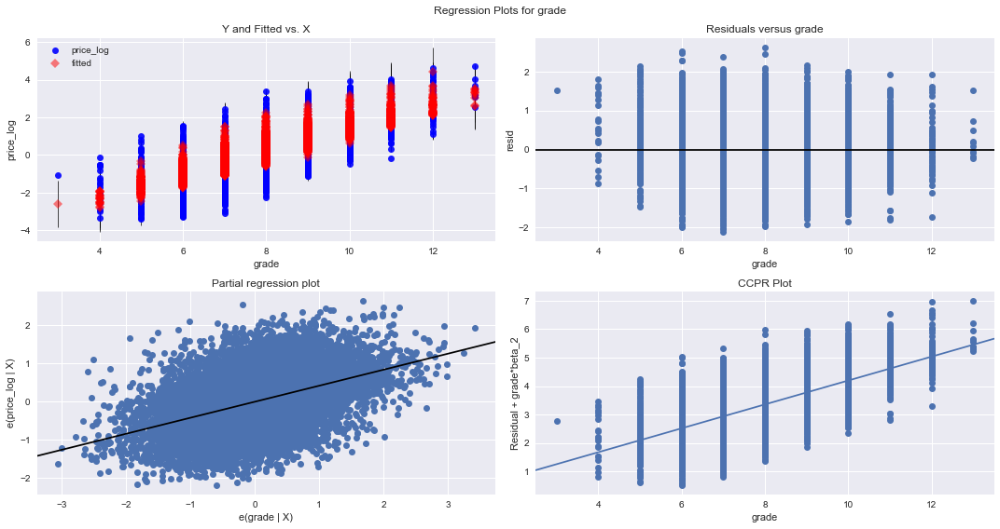

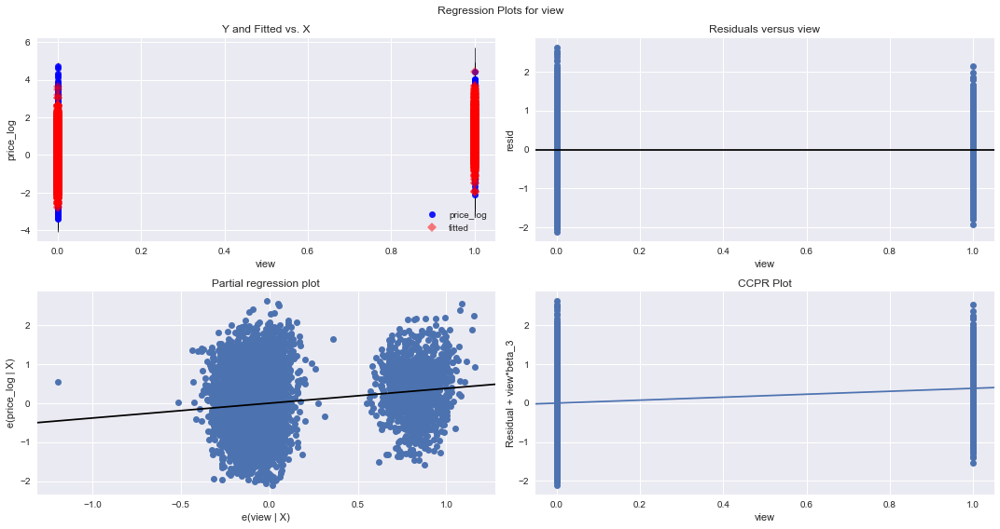

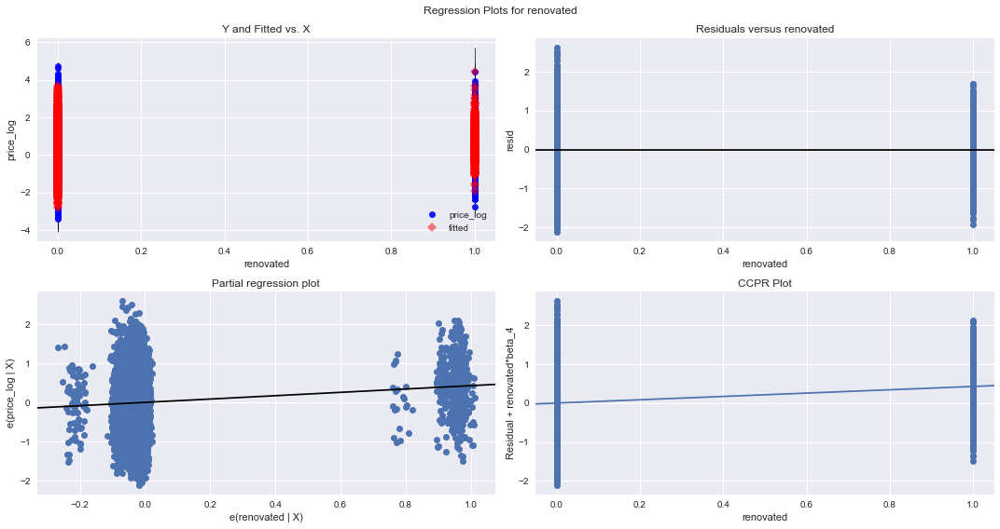

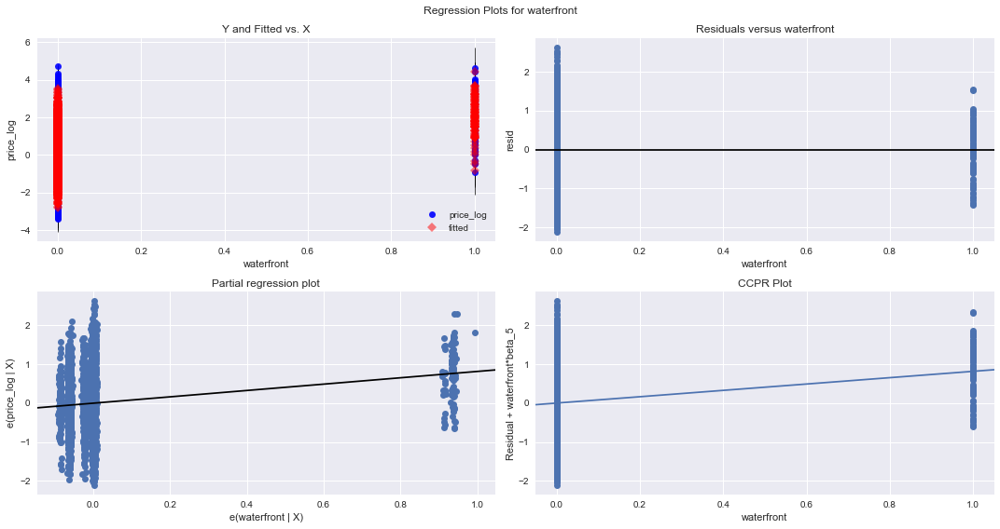

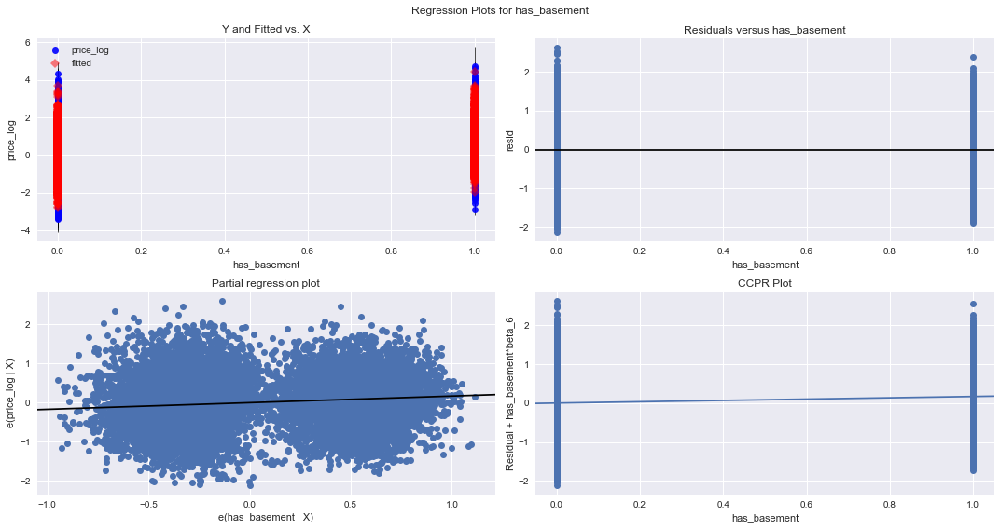

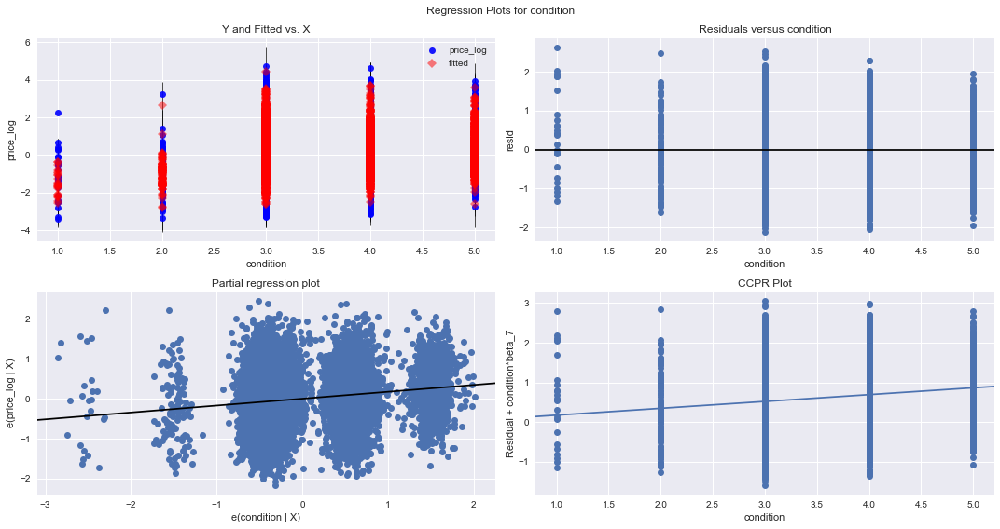

In [263]:
# plot feature residuals and check for homoskedacity
plot_residuals(model_nbr=3, model=model_3)

In [264]:
# cross validation to compare MAE on entire sample for m1 features
X_CV_m3 = X[features_m3]
y_CV_m3 = y['price_log']

kfolds(X_CV_m3, y_CV_m3, cv=5)

Cross-Validation MAE results: [0.52114309 0.51754669 0.51563471 0.51716328 0.47355205] | CV MAE Mean: 0.5090079635366801


## Model 4

In [265]:
# model 4 setup and call statsmodel function
features_m4 = ['sqft_living_log', 'grade', 'view', 'renovated', 
               'waterfront', 'has_basement', 'condition','zipcode_98002', 'zipcode_98003',
               'zipcode_98004', 'zipcode_98005', 'zipcode_98006', 'zipcode_98007', 'zipcode_98008',
               'zipcode_98010', 'zipcode_98011', 'zipcode_98014', 'zipcode_98019', 'zipcode_98022', 
               'zipcode_98023', 'zipcode_98024', 'zipcode_98027', 'zipcode_98028', 
               'zipcode_98029', 'zipcode_98030', 'zipcode_98031', 'zipcode_98032', 'zipcode_98033', 
               'zipcode_98034', 'zipcode_98038', 'zipcode_98039', 
               'zipcode_98040', 'zipcode_98042', 'zipcode_98045', 'zipcode_98052', 'zipcode_98053', 
               'zipcode_98055', 'zipcode_98056', 'zipcode_98058', 
               'zipcode_98059', 'zipcode_98065', 'zipcode_98070', 'zipcode_98072', 'zipcode_98074', 
               'zipcode_98075', 'zipcode_98077', 'zipcode_98092', 
               'zipcode_98102', 'zipcode_98103', 'zipcode_98105', 'zipcode_98106', 'zipcode_98107', 
               'zipcode_98108', 'zipcode_98109', 'zipcode_98112', 
               'zipcode_98115', 'zipcode_98116', 'zipcode_98117', 'zipcode_98118', 'zipcode_98119', 
               'zipcode_98122', 'zipcode_98125', 'zipcode_98126', 
               'zipcode_98133', 'zipcode_98136', 'zipcode_98144', 'zipcode_98146', 'zipcode_98148', 
               'zipcode_98155', 'zipcode_98166', 'zipcode_98168', 
               'zipcode_98177', 'zipcode_98178', 'zipcode_98188', 'zipcode_98198', 'zipcode_98199'] 

# apply features to X_train and chose which y to predict
X_train_m4 = sm.add_constant(X_train[features_m4])
y_train_m4 = y_train['price_log']

# apply features to X_test and chose which y to predict
X_test_m4 = sm.add_constant(X_test[features_m4])
y_test_m4 = y_test['price_log']

# quick check of rows
X_train_m4.head()

,const,sqft_living_log,grade,view,renovated,waterfront,has_basement,condition,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
629,1.0,1.283792,9,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7185,1.0,-0.648238,7,1,0,0,1,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1329,1.0,0.834936,8,1,0,0,1,3,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1029,1.0,-1.100834,7,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
15436,1.0,0.826097,7,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [266]:
model_4 = sm.OLS(y_train_m4, X_train_m4).fit()
model_4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.872
Model:                            OLS   Adj. R-squared:                  0.871
Method:                 Least Squares   F-statistic:                     1421.
Date:                Fri, 05 Nov 2021   Prob (F-statistic):               0.00
Time:                        09:15:04   Log-Likelihood:                -6272.4
No. Observations:               15946   AIC:                         1.270e+04
Df Residuals:                   15869   BIC:                         1.329e+04
Df Model:                          76                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -2.9144      0.043    -68.214      0.000      -2.998      -2.831
sqft_living_log     0.4020      0.005     84.550      0.000       0.393       0.411
grade               0.2121      0.004     51.823      0.000       0.204       0.220
view                0.3437      0.011     31.531      0.000       0.322       0.365
renovated           0.1674      0.016     10.687      0.000       0.137       0.198
waterfront          1.0559      0.038     27.745      0.000       0.981       1.131
has_basement       -0.0860      0.007    -12.660      0.000      -0.099      -0.073
condition           0.1113      0.005     23.972      0.000       0.102       0.120
zipcode_98002      -0.0658      0.037     -1.801      0.072      -0.137       0.006
zipcode_98003       0.0044      0.034      0.129      0.898      -0.062       0.071
zipcode_98004       2.1699      0.032     67.275      0.000       2.107       2.233
zipcode_98005       1.4579      0.040     36.700      0.000       1.380       1.536
zipcode_98006       1.2465      0.029     42.931      0.000       1.190       1.303
zipcode_98007       1.2249      0.041     29.897      0.000       1.145       1.305
zipcode_98008       1.2236      0.033     37.405      0.000       1.160       1.288
zipcode_98010       0.5324      0.049     10.848      0.000       0.436       0.629
zipcode_98011       0.8644      0.038     22.989      0.000       0.791       0.938
zipcode_98014       0.6473      0.046     14.153      0.000       0.558       0.737
zipcode_98019       0.6089      0.039     15.613      0.000       0.532       0.685
zipcode_98022       0.0495      0.037      1.339      0.180      -0.023       0.122
zipcode_98023      -0.0676      0.029     -2.365      0.018      -0.124      -0.012
zipcode_98024       0.8981      0.060     14.909      0.000       0.780       1.016
zipcode_98027       1.0278      0.030     34.308      0.000       0.969       1.087
zipcode_98028       0.7889      0.033     23.813      0.000       0.724       0.854
zipcode_98029       1.1052      0.033     33.990      0.000       1.041       1.169
zipcode_98030       0.0649      0.034      1.925      0.054      -0.001       0.131
zipcode_98031       0.1222      0.033      3.718      0.000       0.058       0.187
zipcode_98032      -0.0737      0.043     -1.712      0.087      -0.158       0.011
zipcode_98033       1.4940      0.029     50.645      0.000       1.436       1.552
zipcode_98034       1.0383      0.028     37.041      0.000       0.983       1.093
zipcode_98038       0.3022      0.028     10.748      0.000       0.247       0.357
zipcode_98039       2.5515      0.062     41.149      0.000       2.430       2.673
zipcode_98040       1.6789      0.034     49.913      0.000       1.613       1.745
zipcode_98042       0.1119      0.028      3.976      0.000

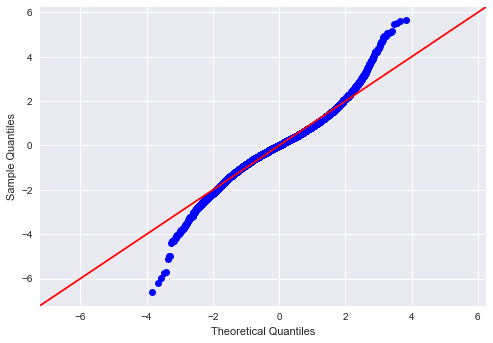

In [267]:
sm.graphics.qqplot(model_4.resid, dist=stats.norm, line='45', fit=True);

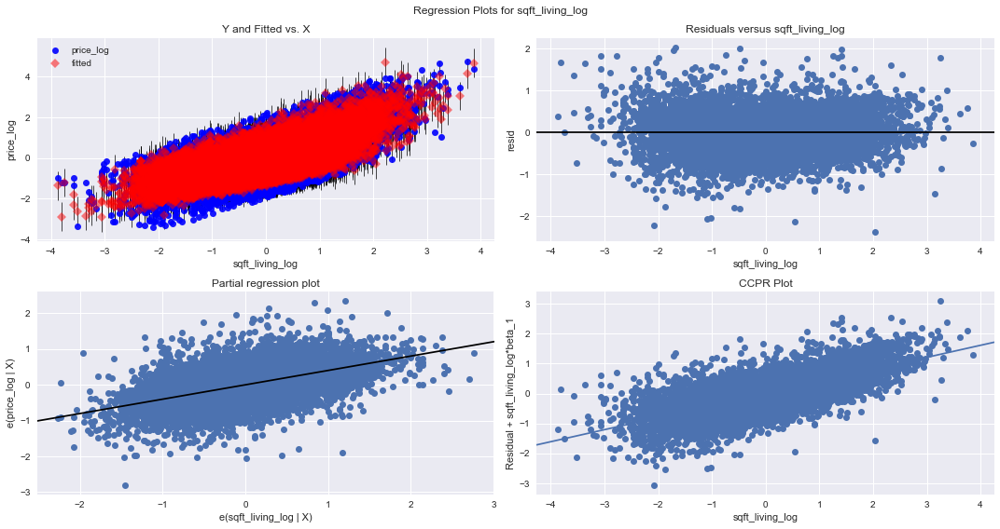

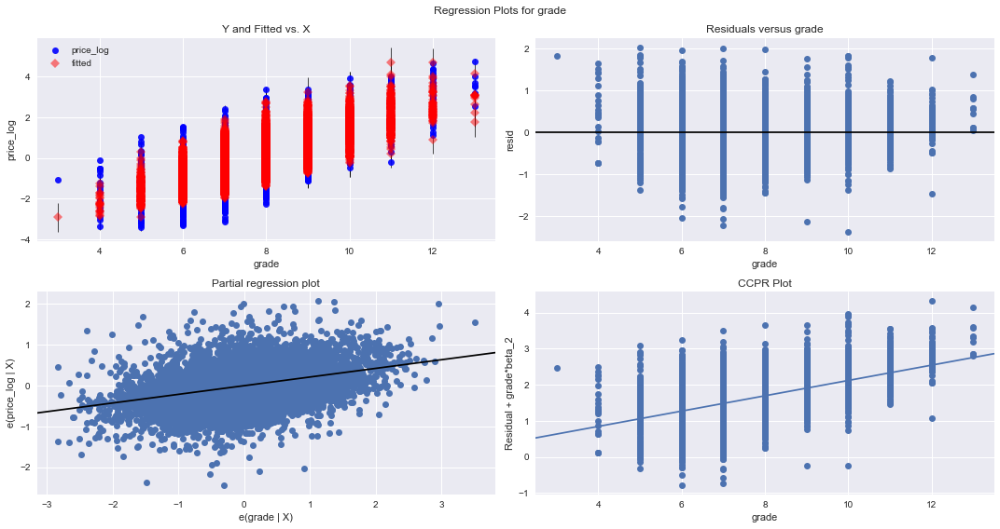

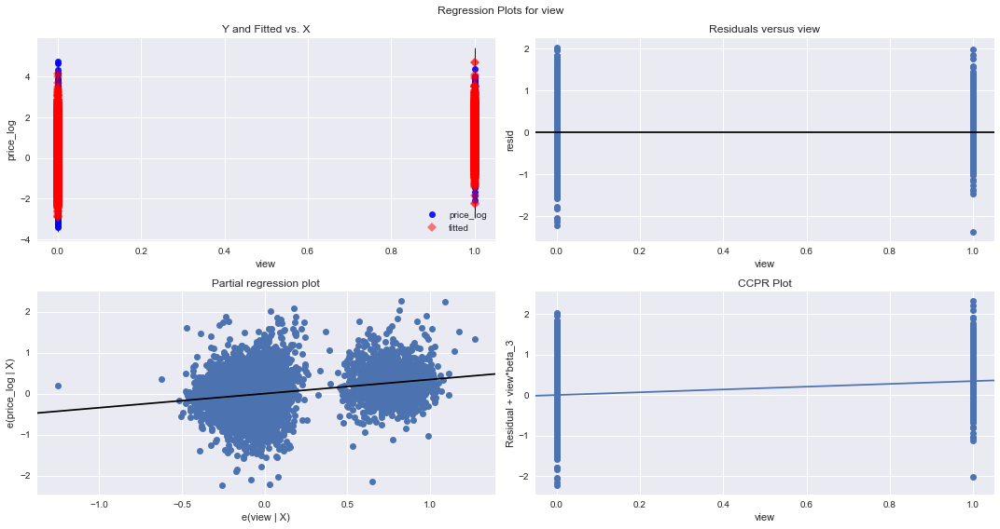

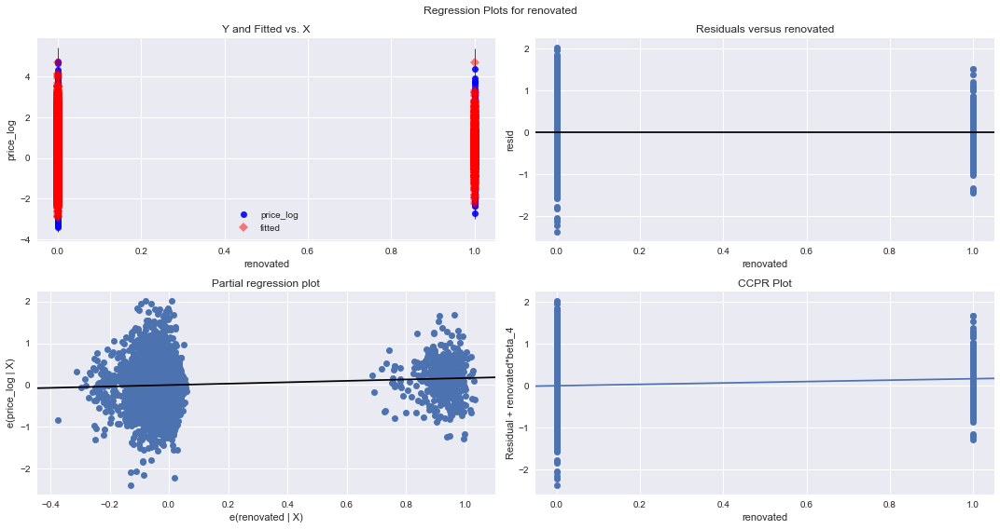

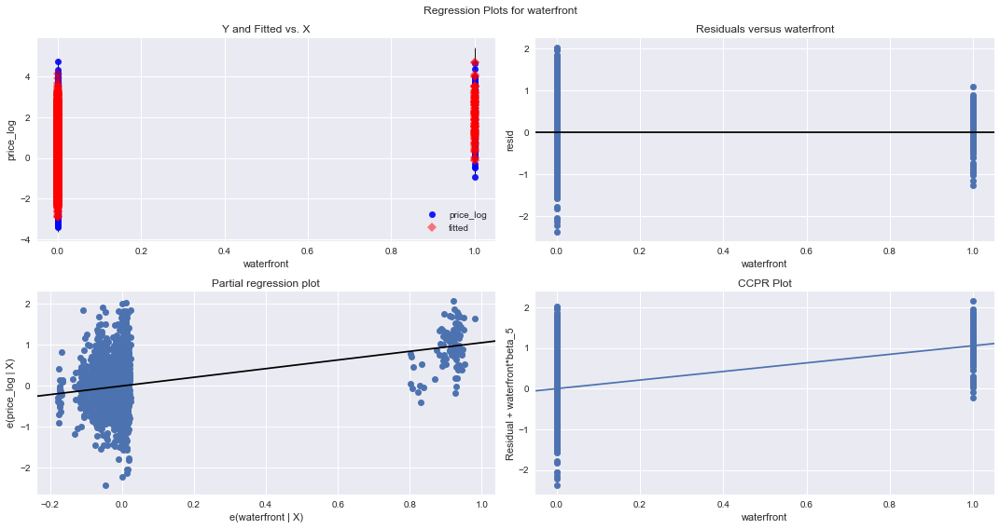

...

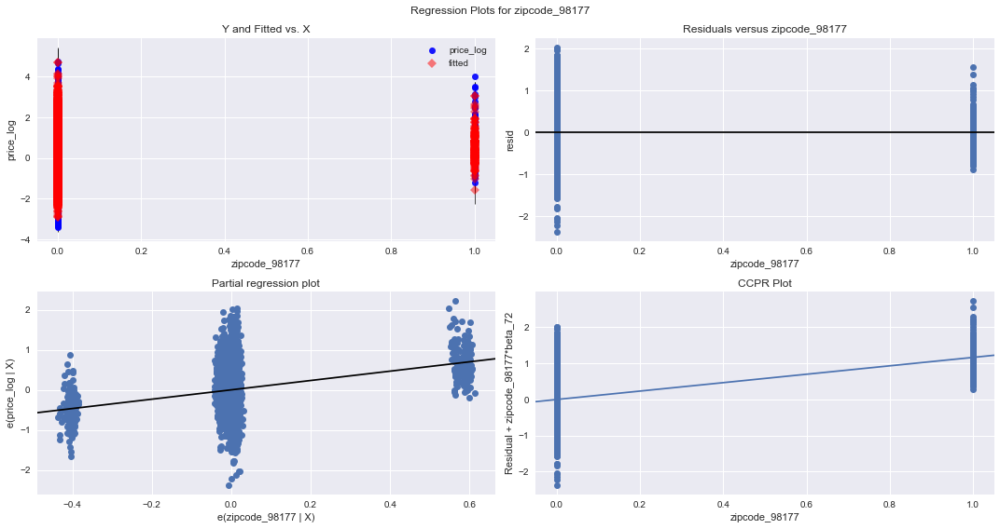

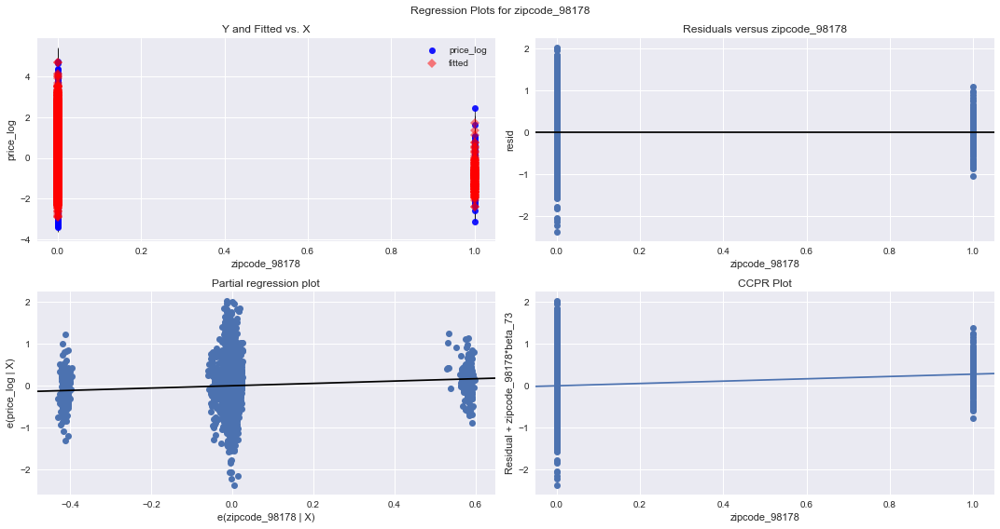

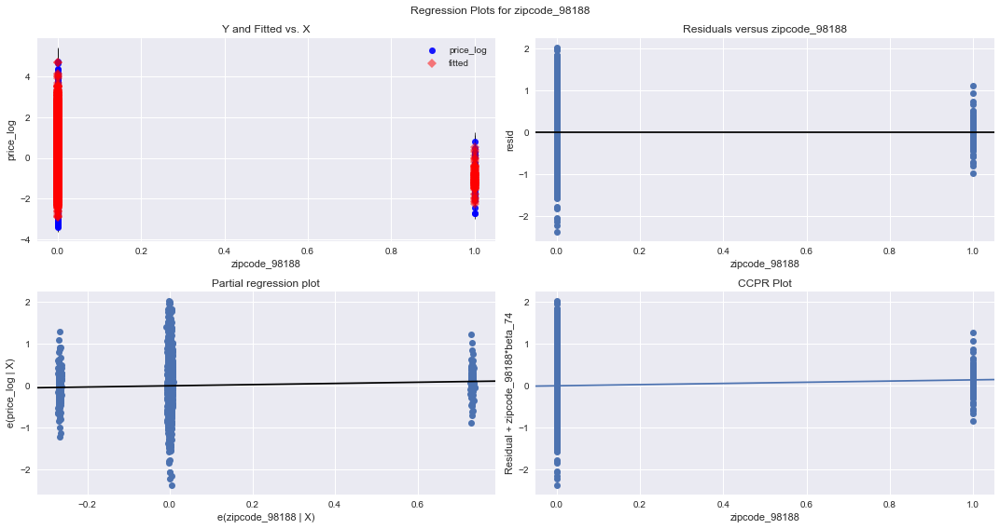

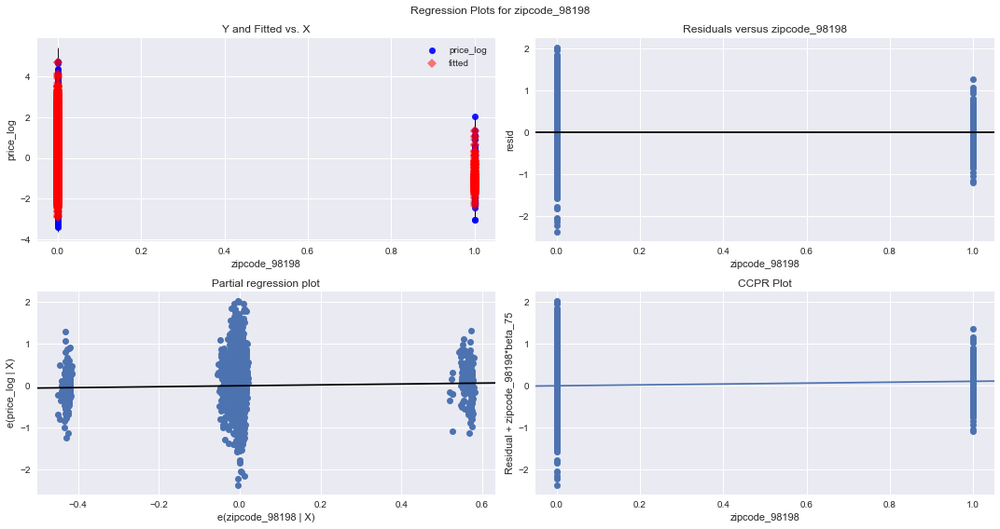

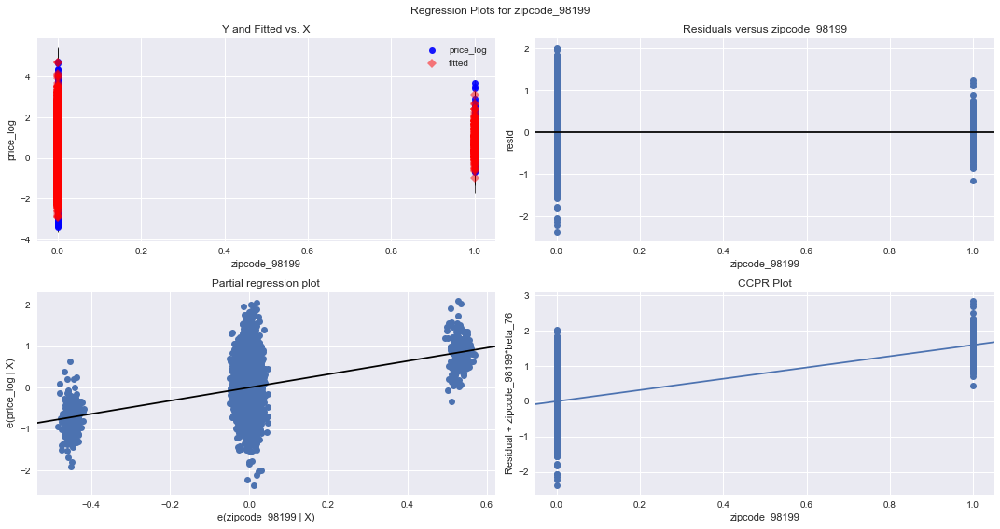

In [268]:
# plot feature residuals and check for homoskedacity
plot_residuals(model_nbr=4, model=model_4)

In [269]:
# cross validation to compare MAE on entire sample for features
X_CV_m4 = X[features_m4]
y_CV_m4 = y['price_log']

kfolds(X_CV_m4, y_CV_m4, cv=5)

Cross-Validation MAE results: [0.27047864 0.26751129 0.26235853 0.26653359 0.25611109] | CV MAE Mean: 0.26459863120237076


## Model 5

In [270]:
# model 5 setup and call statsmodel function
features_m5 = ['sqft_living', 'sqft_living15', 'grade', 'view', 'renovated', 
               'waterfront', 'bedrooms','has_basement', 'condition', 'grade_cat_gr1_below',
               'grade_cat_gr2_above_avg'] 

# apply features to X_train and chose which y to predict
X_train_m5 = sm.add_constant(X_train[features_m5])
y_train_m5 = y_train['price']

# apply features to X_test and chose which y to predict
X_test_m5 = sm.add_constant(X_test[features_m5])
y_test_m5 = y_test['price']

# quick check of rows
X_train_m5.head()

,const,sqft_living,sqft_living15,grade,view,renovated,waterfront,bedrooms,has_basement,condition,grade_cat_gr1_below,grade_cat_gr2_above_avg
629,1.0,3250,3110,9,0,0,0,4,0,4,0,1
7185,1.0,1440,1710,7,1,0,0,3,1,3,0,0
1329,1.0,2690,2690,8,1,0,0,2,1,3,0,1
1029,1.0,1190,1190,7,0,0,0,4,0,3,0,0
15436,1.0,2680,1940,7,0,0,0,3,0,3,0,0


In [271]:
model_5 = sm.OLS(y_train_m5, X_train_m5).fit()
model_5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.635
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     2516.
Date:                Fri, 05 Nov 2021   Prob (F-statistic):               0.00
Time:                        09:16:39   Log-Likelihood:            -2.1850e+05
No. Observations:               15946   AIC:                         4.370e+05
Df Residuals:                   15934   BIC:                         4.371e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                   -1.239e+06    2.4e+04    -51.619      0.000   -1.29e+06   -1.19e+06
sqft_living               140.6284      4.112     34.195      0.000     132.567     148.689
sqft_living15              12.0731      4.175      2.892      0.004       3.890      20.257
grade                    1.745e+05   3242.265     53.830      0.000    1.68e+05    1.81e+05
view                     1.267e+05   6401.372     19.786      0.000    1.14e+05    1.39e+05
renovated                1.606e+05   9323.324     17.229      0.000    1.42e+05    1.79e+05
waterfront               6.039e+05   2.27e+04     26.633      0.000    5.59e+05    6.48e+05
bedrooms                -2.122e+04   2478.767     -8.561      0.000   -2.61e+04   -1.64e+04
has_basement             4.769e+04   3788.682     12.588      0.000    4.03e+04    5.51e+04
condition                5.753e+04   2706.840     21.254      0.000    5.22e+04    6.28e+04
grade_cat_gr1_below      1.614e+05   6803.909     23.729      0.000    1.48e+05    1.75e+05
grade_cat_gr2_above_avg -1.187e+05   4635.125    -25.618      0.000   -1.28e+05    -1.1e+05
==============================================================================
Omnibus:                     8009.208   Durbin-Watson:                   2.017
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           147307.482
Skew:                           1.982   Prob(JB):                         0.00
Kurtosis:                      17.353   Cond. No.                     4.37e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.37e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

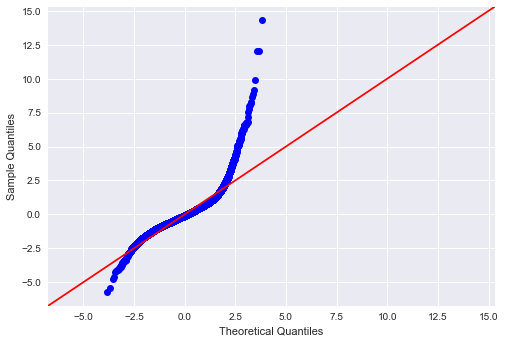

In [272]:
sm.graphics.qqplot(model_5.resid, dist=stats.norm, line='45', fit=True);

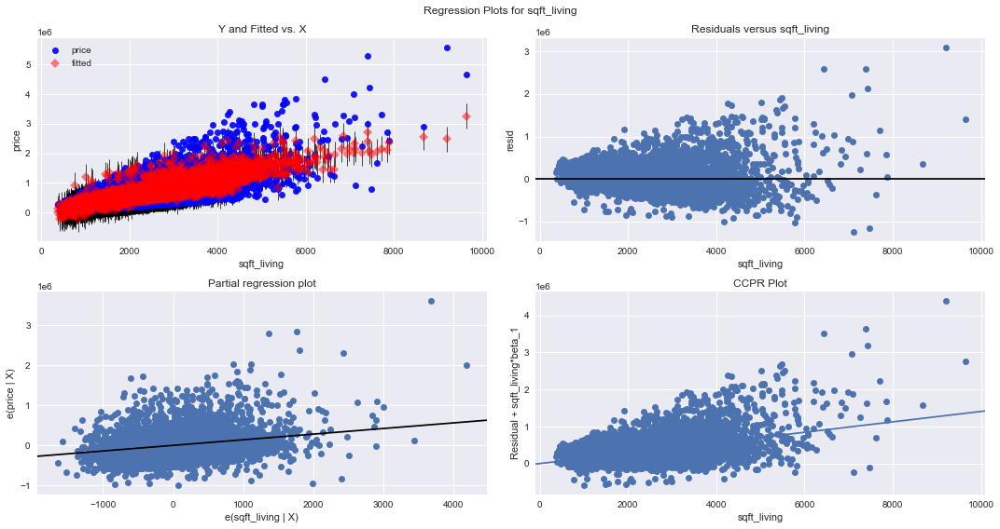

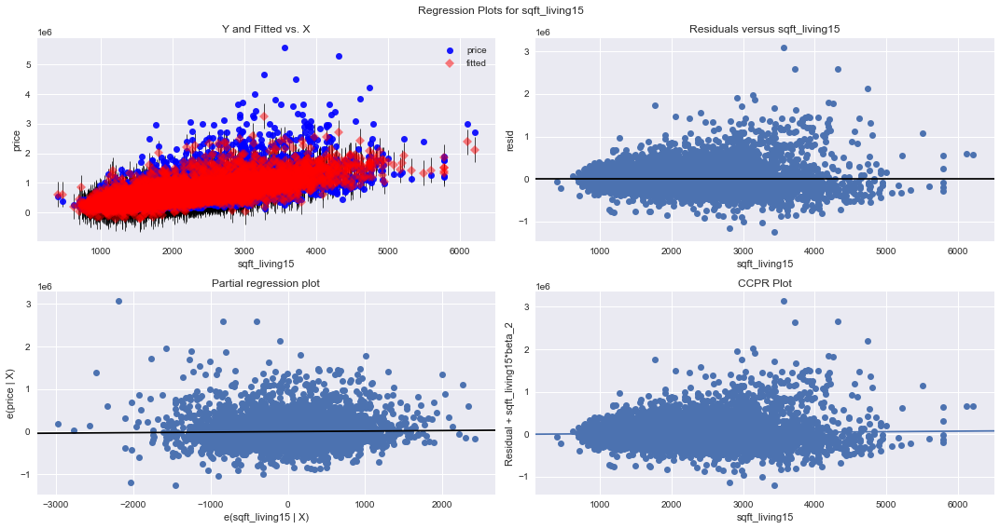

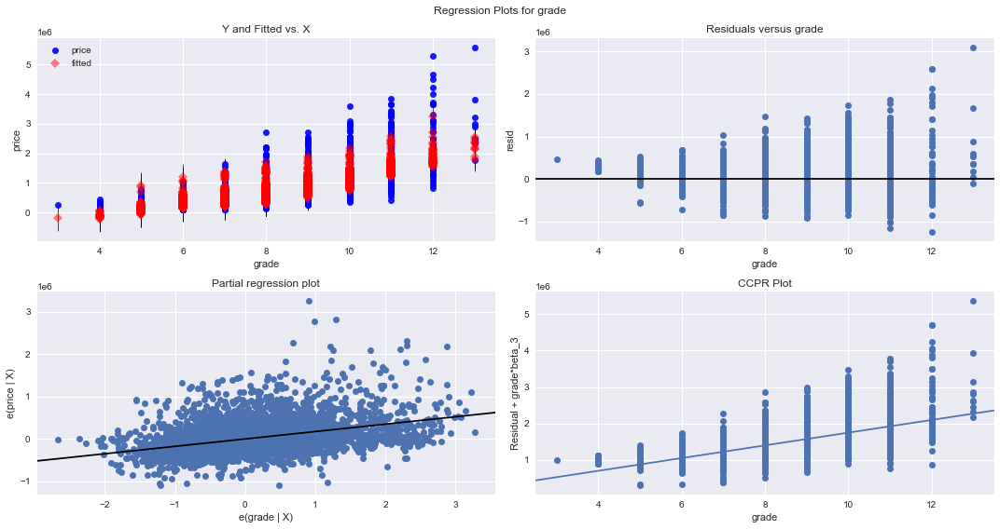

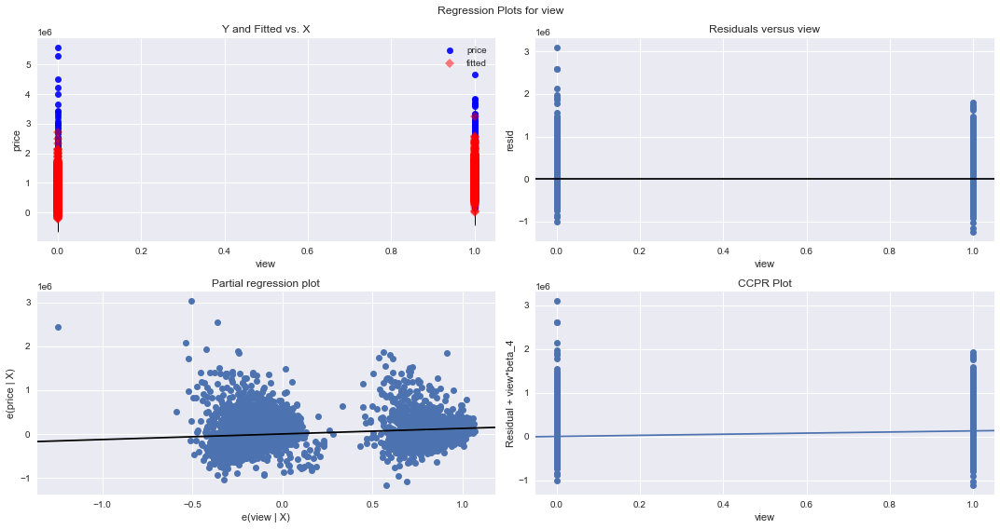

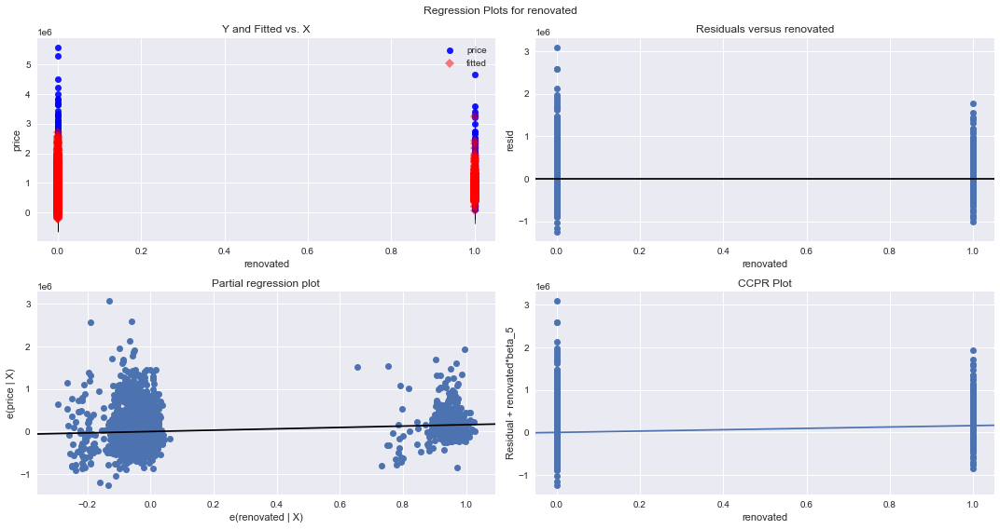

...

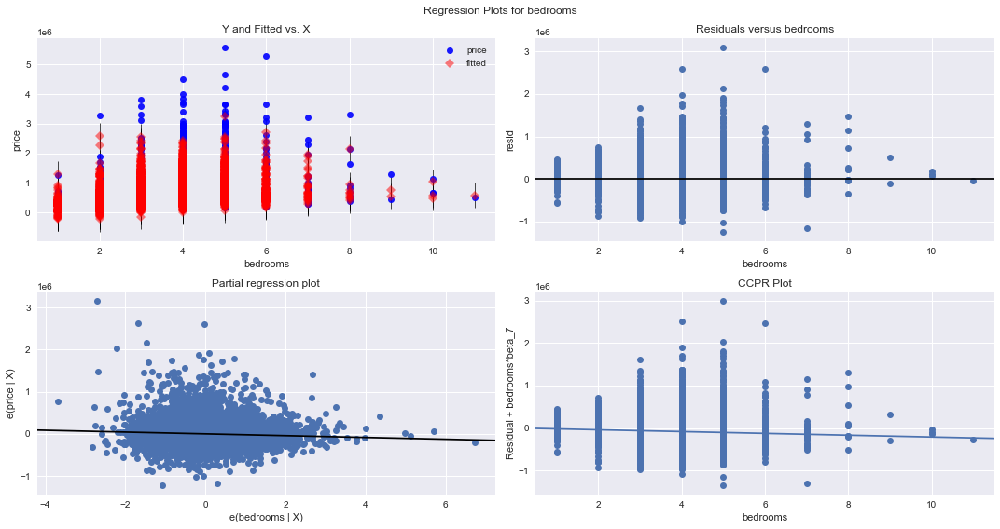

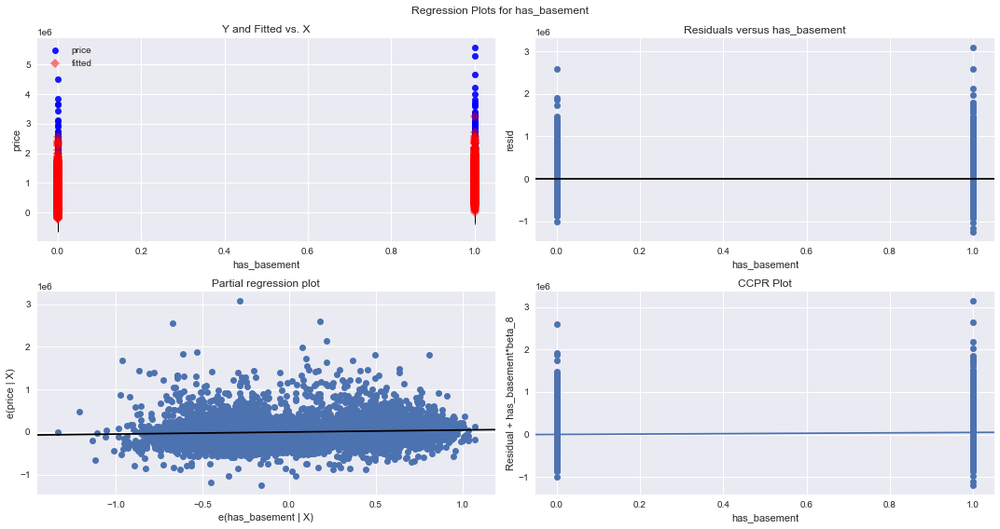

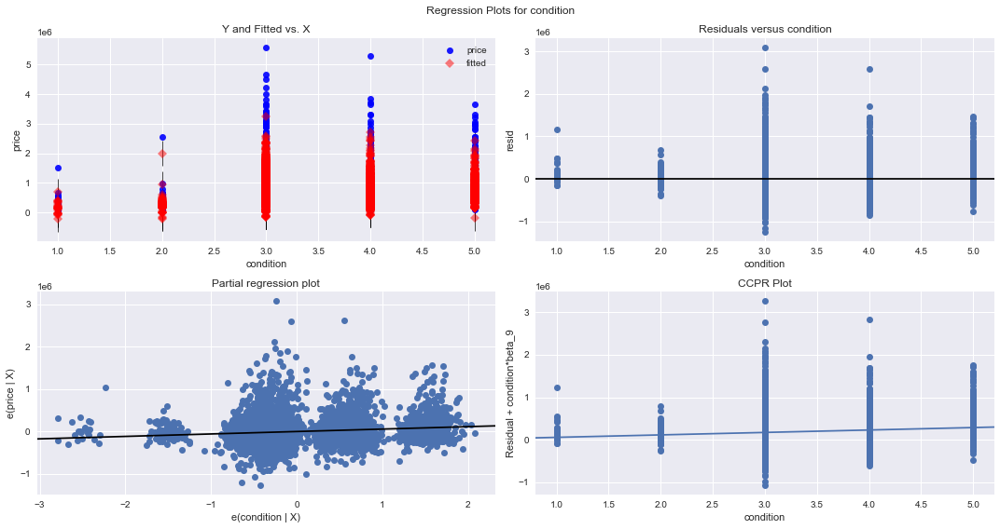

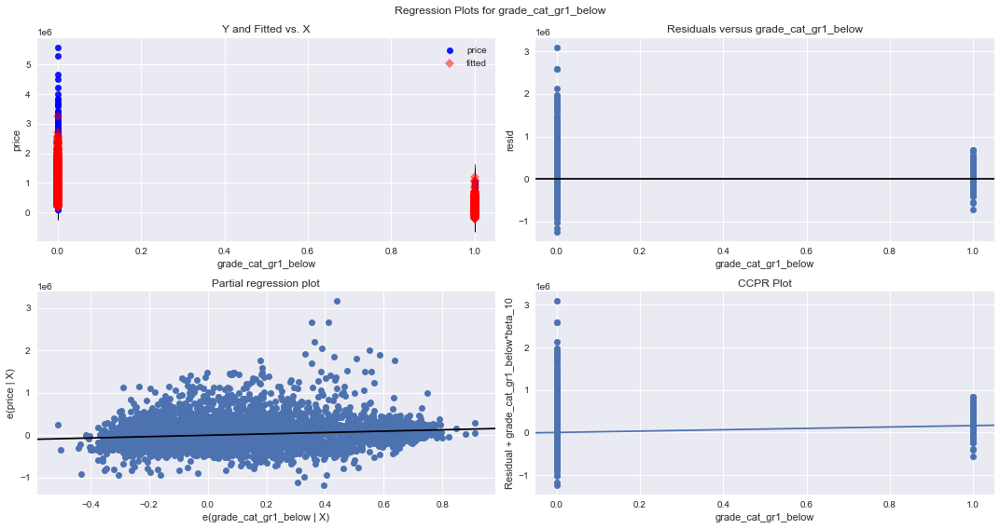

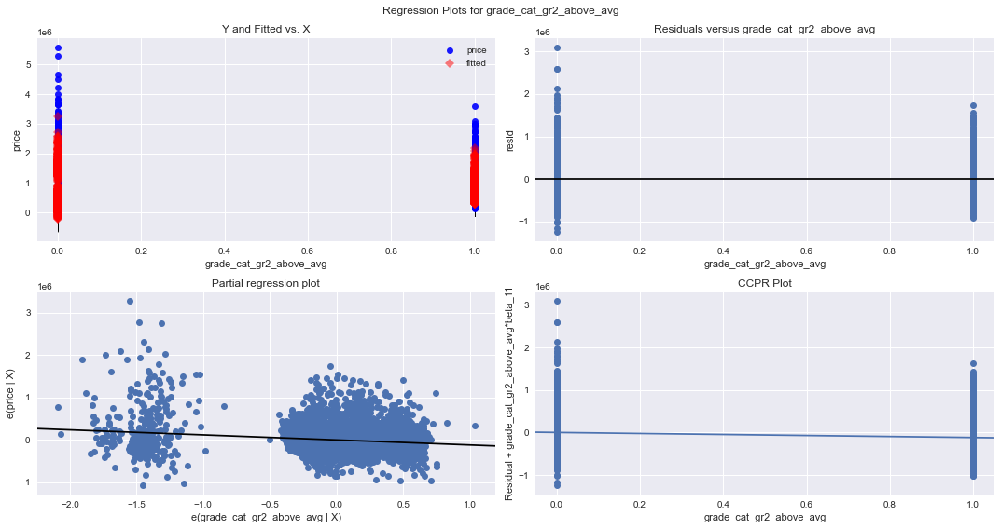

In [273]:
# plot feature residuals and check for homoskedacity
plot_residuals(model_nbr=5, model=model_5)

In [274]:
# cross validation to compare MAE on entire sample for features
X_CV_m5 = X[features_m5]
y_CV_m5 = y['price']

kfolds(X_CV_m5, y_CV_m5, cv=5)

Cross-Validation MAE results: [148565.31025572 147018.44395778 142004.52877249 148788.17521781
 144890.01768724] | CV MAE Mean: 146253.29517820882


In [275]:
linreg.predict(X_test_m5)

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 6 is different from 12)

In [ ]:
linreg.score(X_test_m5, y_test_m5)

In [ ]:
y_pred_train = linreg.predict (X_train_m5)
y_pred_test = linreg.predict(X_test_m5)

In [276]:
mae = metrics.mean_absolute_error(y_train_m5, y_pred_train)
mse = metrics.mean_squared_error(y_train_m5, y_pred_train)
rmse = np.sqrt(mse)  
r2 = metrics.r2_score(y_train_m5, y_pred_train)

print("Results of Model 5:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of Model 5:
MAE: 167485.5169524228
MSE: 62055413402.81312
RMSE: 249109.23989850943
R-Squared: 0.5145946437962563


In [297]:
# model 6 setup and call statsmodel function
features_m6 = ['sqft_living', 'sqft_living15', 'view', 'renovated', 
               'waterfront', 'bedrooms','has_basement', 'grade'] 

# apply features to X_train and chose which y to predict
X_train_m6 = sm.add_constant(X_train[features_m6])
y_train_m6 = y_train['price']

# apply features to X_test and chose which y to predict
X_test_m6 = sm.add_constant(X_test[features_m6])
y_test_m6 = y_test['price']

# quick check of rows
X_train_m5.head()

,const,sqft_living,sqft_living15,grade,view,renovated,waterfront,bedrooms,has_basement,condition,grade_cat_gr1_below,grade_cat_gr2_above_avg
629,1.0,3250,3110,9,0,0,0,4,0,4,0,1
7185,1.0,1440,1710,7,1,0,0,3,1,3,0,0
1329,1.0,2690,2690,8,1,0,0,2,1,3,0,1
1029,1.0,1190,1190,7,0,0,0,4,0,3,0,0
15436,1.0,2680,1940,7,0,0,0,3,0,3,0,0


In [298]:
model_6 = sm.OLS(y_train_m6, X_train_m6).fit()
model_6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.597
Model:                            OLS   Adj. R-squared:                  0.597
Method:                 Least Squares   F-statistic:                     2957.
Date:                Fri, 05 Nov 2021   Prob (F-statistic):               0.00
Time:                        09:35:45   Log-Likelihood:            -2.1927e+05
No. Observations:               15946   AIC:                         4.386e+05
Df Residuals:                   15937   BIC:                         4.386e+05
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -5.125e+05   1.64e+04    -31.205      0.000   -5.45e+05    -4.8e+05
sqft_living     171.5888      4.217     40.694      0.000     163.324     179.854
sqft_living15    13.1041      4.371      2.998      0.003       4.536      21.672
view           1.424e+05   6697.543     21.259      0.000    1.29e+05    1.56e+05
renovated      1.415e+05   9761.034     14.501      0.000    1.22e+05    1.61e+05
waterfront     6.353e+05   2.38e+04     26.714      0.000    5.89e+05    6.82e+05
bedrooms      -3.392e+04   2542.774    -13.341      0.000   -3.89e+04   -2.89e+04
has_basement   4.194e+04   3909.380     10.727      0.000    3.43e+04    4.96e+04
grade          9.751e+04   2582.643     37.756      0.000    9.24e+04    1.03e+05
==============================================================================
Omnibus:                     8939.563   Durbin-Watson:                   2.003
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           192830.464
Skew:                           2.253   Prob(JB):                         0.00
Kurtosis:                      19.429   Cond. No.                     4.04e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.04e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

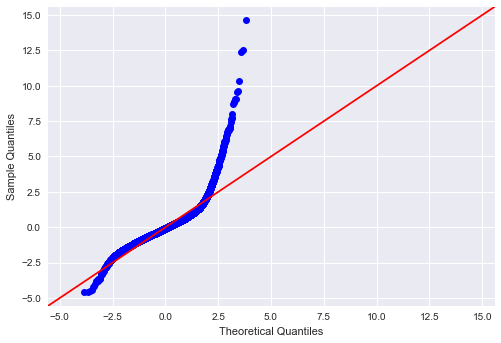

In [299]:
sm.graphics.qqplot(model_6.resid, dist=stats.norm, line='45', fit=True);

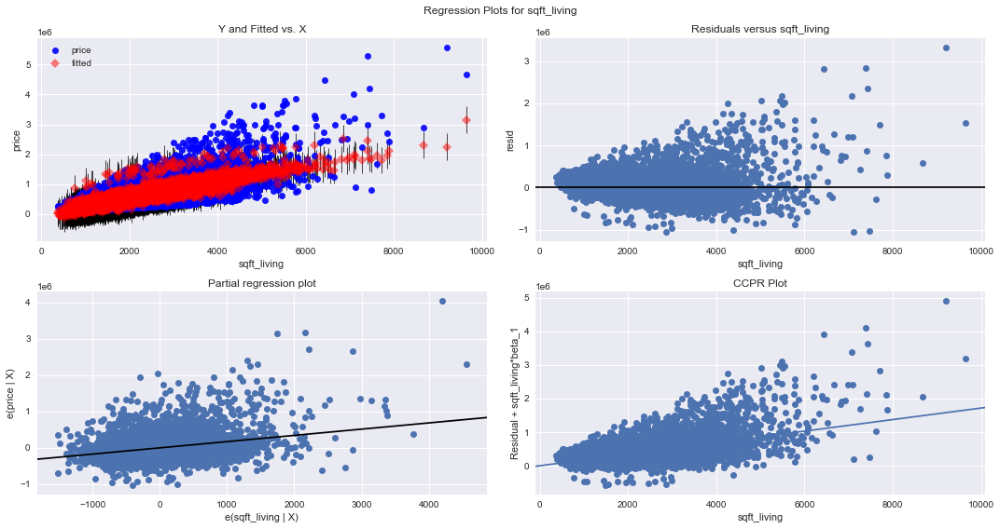

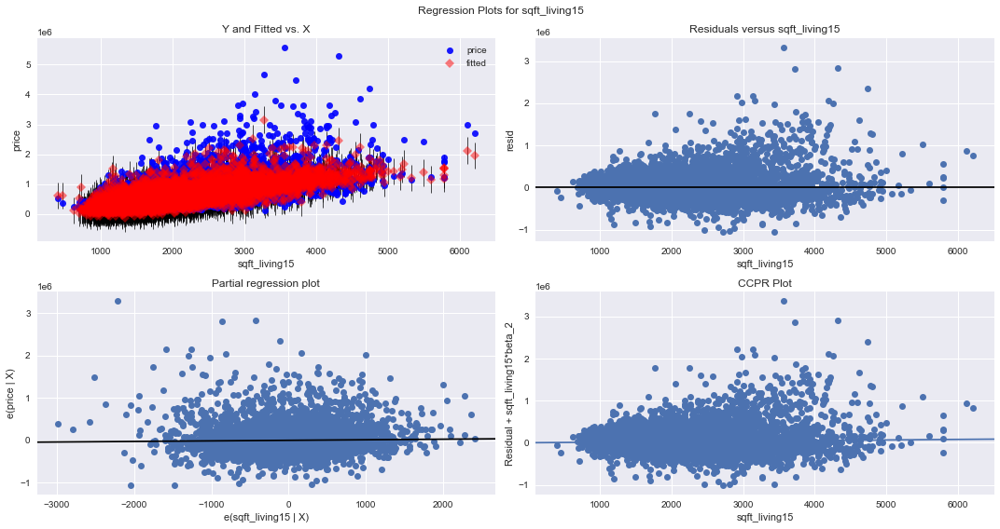

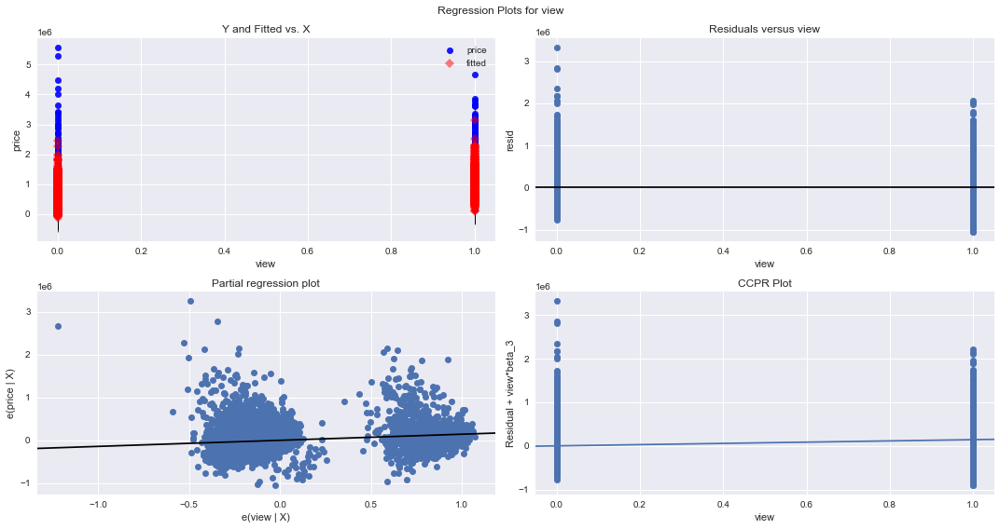

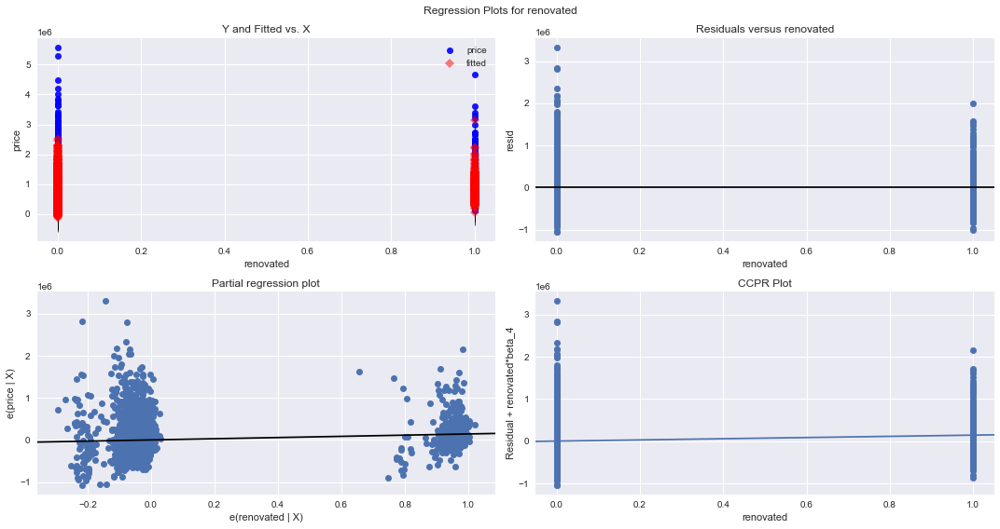

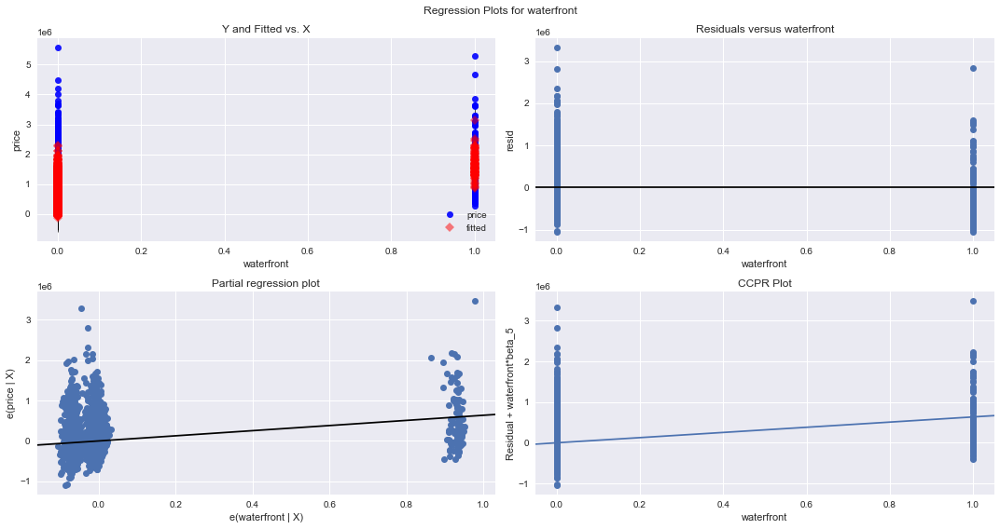

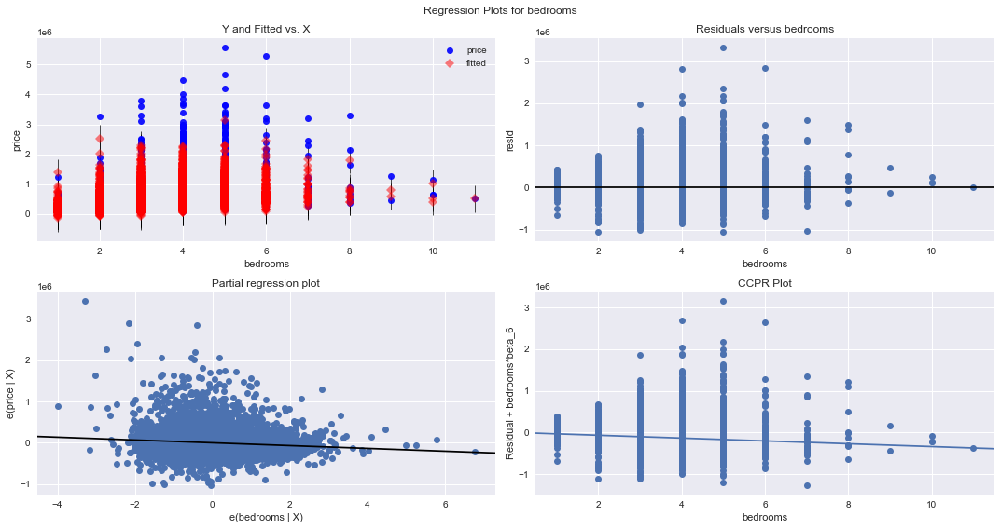

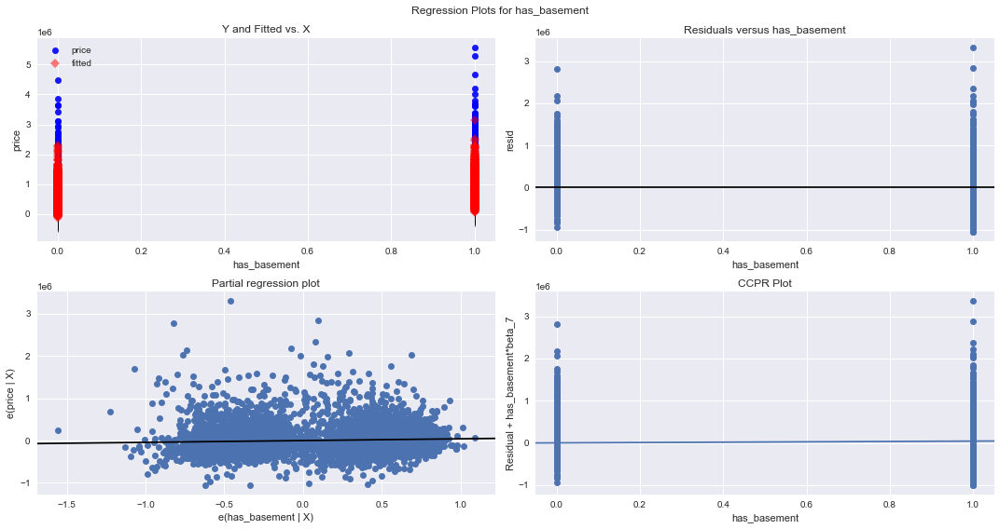

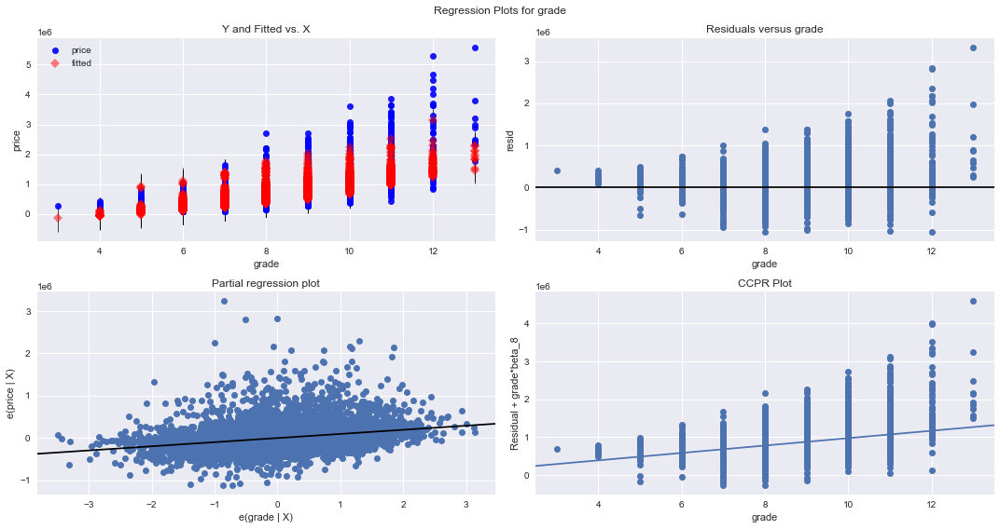

In [300]:
# plot feature residuals and check for homoskedacity
plot_residuals(model_nbr=6, model=model_6)

In [301]:
# cross validation to compare MAE on entire sample for features
X_CV_m6 = X[features_m6]
y_CV_m6 = y['price']

kfolds(X_CV_m6, y_CV_m6, cv=5)

Cross-Validation MAE results: [154197.21516249 152632.21676634 148650.6115713  155057.81336174
 153791.83171189] | CV MAE Mean: 152865.9377147526


In [302]:
# Fit model with training data.
linreg = LinearRegression()
linreg.fit(X_train_m6, y_train_m6)

LinearRegression()

In [303]:
linreg.score(X_test_m6, y_test_m6)

0.600567671830754

In [304]:
y_pred_train = linreg.predict (X_train_m6)
y_pred_test = linreg.predict(X_test_m6)

In [305]:
mae = metrics.mean_absolute_error(y_train_m6, y_pred_train)
mse = metrics.mean_squared_error(y_train_m6, y_pred_train)
rmse = np.sqrt(mse)  
r2 = metrics.r2_score(y_train_m6, y_pred_train)

print("Results of Model 1:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of Model 1:
MAE: 152968.03108131845
MSE: 51462927983.50994
RMSE: 226854.42024238792
R-Squared: 0.5974504153735791


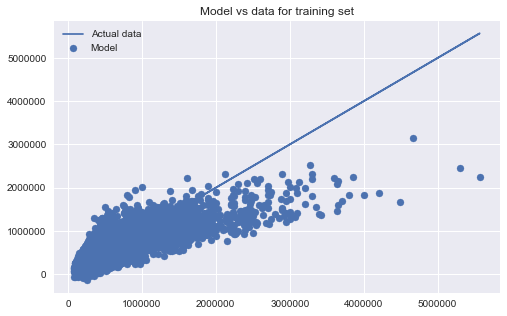

In [306]:

# vertical distance between the points and the line denote the errors
#model to make predictions on both the training and test sets:
plt.figure(figsize=(8, 5))
plt.scatter(y_train_m6, y_pred_train, label='Model')
plt.plot(y_train_m6, y_train_m6, label='Actual data')
plt.title('Model vs data for training set')
plt.ticklabel_format(style='plain')
plt.legend();

In [309]:
create_vif_dct(X_train_m6)

{'const': 83.53797360501841,
 'sqft_living': 4.427999406902958,
 'sqft_living15': 2.752648422281432,
 'view': 1.1929854307978607,
 'renovated': 1.015276037461805,
 'waterfront': 1.0698399332938504,
 'bedrooms': 1.6385368280607726,
 'has_basement': 1.1195911538773557,
 'grade': 2.789590073560748}

# Conclusion

The most important features in relation to the price of a house in Kings County are square footage, location, and grade of the house

### Recommendations

1. If you are selling your house or increase the value of it, try and increase the square footage of the house (whether it's adding an addition to the property)
2. Target waterfront homes (buying or selling) since they profit more than homes without a waterfront view.
3. If you are selling, improve the quality of your house by investing in upgrades. Grade has proven to be a huge factor correlating with the price

### Future Work

1. Look at location to see how much of a factor it plays into the price of a house (zipcode, lat, long).
2. Gather data from different school districts in KC to see if there is a relationship with prices of a house and the quality of schools.
3. Get before/after stats on renovated houses to see the frequency houses are being renovated and if it has an effect on prices